<a href="https://colab.research.google.com/github/ankit986/News-Popularity-Prediction/blob/EDA/News_Popularity_Prediction_in_Social_Media_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <b><u> Project Title : Predicting the news popularity in multiple social media platforms. </u></b>

## <b> Problem Description </b>

### This is a large data set of news items and their respective social feedback on multiple platforms: Facebook, Google+ and LinkedIn.The collected data relates to a period of 8 months, between November 2015 and July 2016, accounting for about 100,000 news items on four different topics: Economy, Microsoft, Obama and Palestine.


## <b> Data Description </b>

### <b>Attribute Information: </b>

* ### IDLink (numeric): Unique identifier of news items
* ### Title (string): Title of the news item according to the official media sources
* ### Headline (string): Headline of the news item according to the official media sources
* ### Source (string): Original news outlet that published the news item
* ### Topic (string): Query topic used to obtain the items in the official media sources
* ### PublishDate (timestamp): Date and time of the news items' publication
* ### SentimentTitle (numeric): Sentiment score of the text in the news items' title
* ### SentimentHeadline (numeric): Sentiment score of the text in the news items' headline
* ### Facebook (numeric): Final value of the news items' popularity according to the social media source Facebook
* ### GooglePlus (numeric): Final value of the news items' popularity according to the social media source Google+
* ### LinkedIn (numeric): Final value of the news items' popularity according to the social media source LinkedIn


### VARIABLES OF SOCIAL FEEDBACK DATA

* ### IDLink (numeric): Unique identifier of news items
* ### TS1 (numeric): Level of popularity in time slice 1 (0-20 minutes upon publication)
* ### TS2 (numeric): Level of popularity in time slice 2 (20-40 minutes upon publication)
* ### TS... (numeric): Level of popularity in time slice ...
* ### TS144 (numeric): Final level of popularity after 2 days upon publication

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.model_selection import train_test_split

from datetime import datetime
import calendar

import nltk
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from textblob import Word


import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install -U textblob
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
sources= ['Facebook', 'GooglePlus', 'LinkedIn']
topics = ['Economy','Microsoft', 'Obama', 'Palestine']

folder_path = '/content/drive/MyDrive/AlmaBetter/Capstone Projects/News Popularity Prediction/data/'
master_df = pd.read_csv(folder_path+'News_Final.csv')
df = {}
for source in sources:
  for topic in topics:
    file_name = f'{source}_{topic}.csv'
    file_path = f'{folder_path}{file_name}'
    df[f'{source}_{topic}'] = pd.read_csv(file_path)

In [ ]:
df['Facebook_Microsoft'].head()

,IDLink,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12,TS13,TS14,TS15,TS16,TS17,TS18,TS19,TS20,TS21,TS22,TS23,TS24,TS25,TS26,TS27,TS28,TS29,TS30,TS31,TS32,TS33,TS34,TS35,TS36,TS37,TS38,TS39,...,TS105,TS106,TS107,TS108,TS109,TS110,TS111,TS112,TS113,TS114,TS115,TS116,TS117,TS118,TS119,TS120,TS121,TS122,TS123,TS124,TS125,TS126,TS127,TS128,TS129,TS130,TS131,TS132,TS133,TS134,TS135,TS136,TS137,TS138,TS139,TS140,TS141,TS142,TS143,TS144
0,101,-1,-1,-1,-1,-1,30,30,30,30,30,52,52,55,55,55,55,55,55,73,73,73,73,73,73,73,73,73,87,87,87,90,91,92,92,93,93,96,102,102,...,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,128,129,129,129,129,129,131,131,131,131,131,131,131,131,131,131,131,131,131,131,133,133
1,102,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,16,16,16,16,16,23,23,25,25,25,25,25,25,28,28,28,28,28,28,...,54,54,54,54,54,54,54,56,56,56,56,56,56,56,56,56,56,56,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,57,58,58,58
2,103,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,180,180,180,180,180,187,187,...,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,259,260,260,260,260,261,262,262,263
3,104,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,12,12,12,12,12,12,12,...,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13
4,105,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,185,185,185,185,185,188,188,...,277,277,277,286,289,289,296,296,296,300,303,303,303,307,307,307,307,307,307,310,310,312,312,312,312,312,313,313,313,313,314,314,315,315,316,316,316,316,316,316


In [ ]:
news_df = pd.read_csv(folder_path+'News_Final.csv')
master_df = news_df.copy()
master_df.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn
0,99248.0,Obama Lays Wreath at Arlington National Cemetery,Obama Lays Wreath at Arlington National Cemete...,USA TODAY,obama,2002-04-02 00:00:00,0.000000,-0.053300,-1,-1,-1
1,10423.0,A Look at the Health of the Chinese Economy,"Tim Haywood, investment director business-unit...",Bloomberg,economy,2008-09-20 00:00:00,0.208333,-0.156386,-1,-1,-1
2,18828.0,Nouriel Roubini: Global Economy Not Back to 2008,"Nouriel Roubini, NYU professor and chairman at...",Bloomberg,economy,2012-01-28 00:00:00,-0.425210,0.139754,-1,-1,-1
3,27788.0,Finland GDP Expands In Q4,Finland's economy expanded marginally in the t...,RTT News,economy,2015-03-01 00:06:00,0.000000,0.026064,-1,-1,-1
4,27789.0,"Tourism, govt spending buoys Thai economy in J...",Tourism and public spending continued to boost...,The Nation - Thailand&#39;s English news,economy,2015-03-01 00:11:00,0.000000,0.141084,-1,-1,-1


In [ ]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93239 entries, 0 to 93238
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   IDLink             93239 non-null  float64
 1   Title              93239 non-null  object 
 2   Headline           93224 non-null  object 
 3   Source             92960 non-null  object 
 4   Topic              93239 non-null  object 
 5   PublishDate        93239 non-null  object 
 6   SentimentTitle     93239 non-null  float64
 7   SentimentHeadline  93239 non-null  float64
 8   Facebook           93239 non-null  int64  
 9   GooglePlus         93239 non-null  int64  
 10  LinkedIn           93239 non-null  int64  
dtypes: float64(3), int64(3), object(5)
memory usage: 7.8+ MB


In [ ]:
master_df.describe()

,IDLink,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn
count,93239.000000,93239.000000,93239.000000,93239.000000,93239.000000,93239.000000
mean,51560.653257,-0.005411,-0.027493,113.141336,3.888362,16.547957
std,30391.078704,0.136431,0.141964,620.173233,18.492648,154.459048
min,1.000000,-0.950694,-0.755433,-1.000000,-1.000000,-1.000000
25%,24301.500000,-0.079057,-0.114574,0.000000,0.000000,0.000000
50%,52275.000000,0.000000,-0.026064,5.000000,0.000000,0.000000
75%,76585.500000,0.064255,0.059709,33.000000,2.000000,4.000000
max,104802.000000,0.962354,0.964646,49211.000000,1267.000000,20341.000000


In [ ]:
# Increasing Popularity level by 1 to deal with -1 level
for col in sources:
    master_df[col] = master_df[col].apply(lambda x:x+1)

for idf in df:
    for col in df[idf]:
        if col == 'IDLink':
            continue
        df[idf][col] += 1

In [ ]:
df['Facebook_Economy'].head()

,IDLink,TS1,TS2,TS3,TS4,TS5,TS6,TS7,TS8,TS9,TS10,TS11,TS12,TS13,TS14,TS15,TS16,TS17,TS18,TS19,TS20,TS21,TS22,TS23,TS24,TS25,TS26,TS27,TS28,TS29,TS30,TS31,TS32,TS33,TS34,TS35,TS36,TS37,TS38,TS39,...,TS105,TS106,TS107,TS108,TS109,TS110,TS111,TS112,TS113,TS114,TS115,TS116,TS117,TS118,TS119,TS120,TS121,TS122,TS123,TS124,TS125,TS126,TS127,TS128,TS129,TS130,TS131,TS132,TS133,TS134,TS135,TS136,TS137,TS138,TS139,TS140,TS141,TS142,TS143,TS144
0,1,0,0,0,0,0,0,0,0,8,8,8,8,8,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9,10,10,10,10,10,10,...,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,13,14,14,14,14,14,14,14,14,14,14,14,14,14,14,14,14,14,14
1,2,0,0,0,0,0,0,0,0,4,4,4,4,4,4,4,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,16,16,16,18,18,19,19,20,20,...,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43,43
2,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,93,94,94,95,96,97,98,98,98,98,98,98,98,98,98,98,98,98,99,99,99,99,99,99,99,99,99,99,99,99,99,99,99,99,99,99,99,99,99,99
3,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,7,7,7,7,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8,8
4,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35,35


In [ ]:
master_df.Source.value_counts()

Bloomberg                  1732
Reuters                    1321
ABC News                   1098
New York Times              992
The Guardian                933
                           ... 
Leek Post & Times             1
ArmyTimes.com                 1
Muscatine Journal             1
Citrus County Chronicle       1
Star2.com                     1
Name: Source, Length: 5756, dtype: int64

In [ ]:
# Handling Missing Value and Cleaning
master_df[master_df['Source'].isna()].Source = 'Bloomberg'
master_df['Source'].fillna('Bloomberg', inplace = True)
master_df.dropna(inplace = True)

# PublishDate change type to datetime from object
def convert_to_dt(df):
  df['PublishDate'] = pd.to_datetime(df['PublishDate'])
  df['PublishTime'] = df['PublishDate'].dt.time
  df['PublishDate'] = df['PublishDate'].dt.date

convert_to_dt(master_df)

# Extracting Day of the Week
master_df['Weekday'] = master_df.PublishDate.apply(lambda x: calendar.day_name[x.weekday()])

# #change IDLink datatype to string
# master_df['IDLink'] = master_df['IDLink'].astype(int).astype(str)
master_df.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday
0,99248.0,Obama Lays Wreath at Arlington National Cemetery,Obama Lays Wreath at Arlington National Cemete...,USA TODAY,obama,2002-04-02,0.000000,-0.053300,0,0,0,00:00:00,Tuesday
1,10423.0,A Look at the Health of the Chinese Economy,"Tim Haywood, investment director business-unit...",Bloomberg,economy,2008-09-20,0.208333,-0.156386,0,0,0,00:00:00,Saturday
2,18828.0,Nouriel Roubini: Global Economy Not Back to 2008,"Nouriel Roubini, NYU professor and chairman at...",Bloomberg,economy,2012-01-28,-0.425210,0.139754,0,0,0,00:00:00,Saturday
3,27788.0,Finland GDP Expands In Q4,Finland's economy expanded marginally in the t...,RTT News,economy,2015-03-01,0.000000,0.026064,0,0,0,00:06:00,Sunday
4,27789.0,"Tourism, govt spending buoys Thai economy in J...",Tourism and public spending continued to boost...,The Nation - Thailand&#39;s English news,economy,2015-03-01,0.000000,0.141084,0,0,0,00:11:00,Sunday


In [ ]:
# converting source values to lower - define the reason as there is difference in sizes 

print('No. of Sources:',len(list(master_df['Source'].unique())))
print('No. of Distinct Sources:',len(list(master_df['Source'].apply(lambda x:x.lower()).unique())))

No. of Sources: 5755
No. of Distinct Sources: 5740


In [ ]:
# handling date range
print('Start Date:',min(master_df['PublishDate']))
print('End Date:',max(master_df['PublishDate']))

# Taking Value between range 2015 Nov to 2016 July
master_df = master_df[(master_df['PublishDate']>=pd.to_datetime('2015-11-01').date()) & (master_df['PublishDate']<=pd.to_datetime('2016-08-01').date())]

print('Start Date:',min(master_df['PublishDate']))
print('End Date:',max(master_df['PublishDate']))

master_df.head()

Start Date: 2002-04-02
End Date: 2016-07-07
Start Date: 2015-11-01
End Date: 2016-07-07


,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday
6,80690.0,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",Bloomberg,palestine,2016-02-28,0.000000,-0.005906,1,1,1,14:03:00,Sunday
31,28854.0,Buffett: Politicians 'Dead Wrong' on Economy,Warren Buffett has a message for presidential ...,The Wall Street Journal,economy,2016-02-28,0.051031,-0.037921,0,0,0,19:17:00,Sunday
56,81052.0,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",Bloomberg,palestine,2016-03-01,0.000000,0.048546,1,1,1,09:29:00,Tuesday
111,80994.0,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",Bloomberg,palestine,2016-03-01,-0.243068,0.048546,1,1,1,00:15:00,Tuesday
416,946.0,Microsoft Takes Six Billion Dollars From Android,"A long time ago, Microsoft MSFT +0.00% purchas...",Forbes,microsoft,2015-11-01,0.000000,0.115928,0,0,0,00:00:00,Sunday


In [ ]:
# dropping rows whose popularity is -1 in all the social media platforms
index_to_drop = master_df[(master_df['Facebook']==0) & (master_df['GooglePlus']==0) & (master_df['LinkedIn']==0)].index
print('Shape Before Dropping:',master_df.shape)


master_df.drop(index_to_drop,inplace=True)
print('Shape After Dropping:',master_df.shape)

Shape Before Dropping: (92812, 13)
Shape After Dropping: (87481, 13)


In [ ]:
# Dropping Duplicate Rows
print(master_df[master_df.duplicated()])
master_df.drop_duplicates(inplace=True)

        IDLink                Title  ... PublishTime  Weekday
44426  80690.0  Monday, 29 Feb 2016  ...    14:03:00   Sunday
44944  80994.0  Tuesday, 1 Mar 2016  ...    00:15:00  Tuesday
45122  81052.0  Monday, 29 Feb 2016  ...    09:29:00  Tuesday

[3 rows x 13 columns]


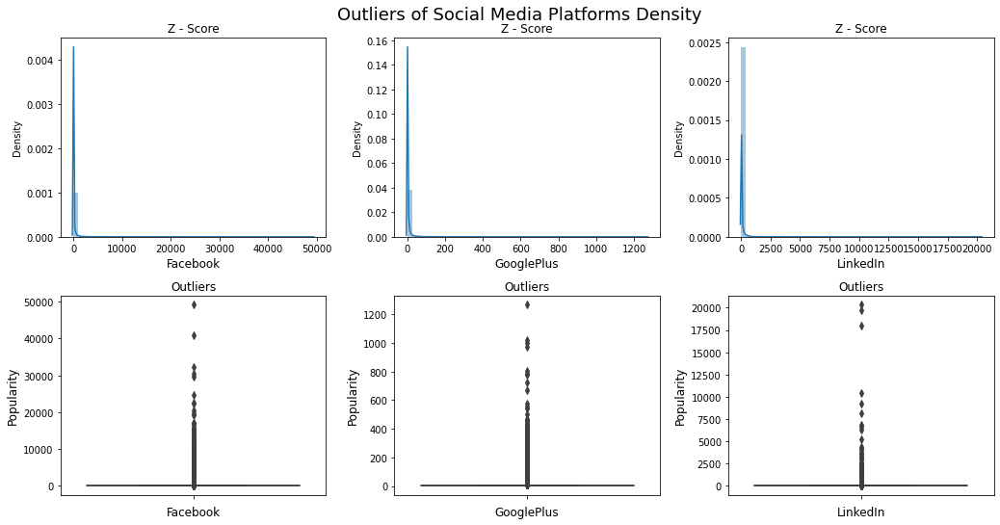

In [ ]:
def show_outliers(df, three_d = False):
    fig, axes = plt.subplots(2,3,figsize=(15, 8))
    fig.tight_layout(pad=4.0)
    for source in range(len(sources)):
        sns.distplot(ax=axes[0][source],x=df[sources[source]])
        axes[0][source].set_xlabel(sources[source],fontdict={'fontsize': 12})
        axes[1][source].set_ylabel('Density',fontdict={'fontsize': 12})

        sns.boxplot(ax=axes[1][source],y=df[sources[source]] )    
        axes[1][source].set_xlabel(sources[source],fontdict={'fontsize': 12})
        axes[1][source].set_ylabel('Popularity',fontdict={'fontsize': 12})

        axes[0][source].set_title('Z - Score')
        axes[1][source].set_title('Outliers')

        plt.suptitle('Outliers of Social Media Platforms Density',fontsize=18)

    plt.show()
    
    if three_d == True:
        fig = px.scatter_3d(df, x='Facebook', y='GooglePlus', z='LinkedIn')
        fig.show()

    # fig = go.Figure(data=[go.Surface(z=df[['Facebook','LinkedIn','GooglePlus']].values)])

    # fig.update_layout(title='abc', autosize=True)

    # fig.show()

show_outliers(master_df, True)

In [ ]:
# print(tenth_percentile, ninetieth_percentile)
# print("old array:",max(master_df[source]))
# print("old array:",max(df[source]))


# Computing 10th, 90th percentiles and treating the outliers
def outliers_treatment(df, sources):
    for source in sources:
        tenth_percentile = np.percentile(df[source], 10)
        ninetieth_percentile = np.percentile(df[source], 90)
        df[source] = np.where(df[source] < tenth_percentile, tenth_percentile, df[source])
        df[source] = np.where(df[source] > ninetieth_percentile, ninetieth_percentile, df[source])

    return df

master_df = outliers_treatment(master_df, sources)

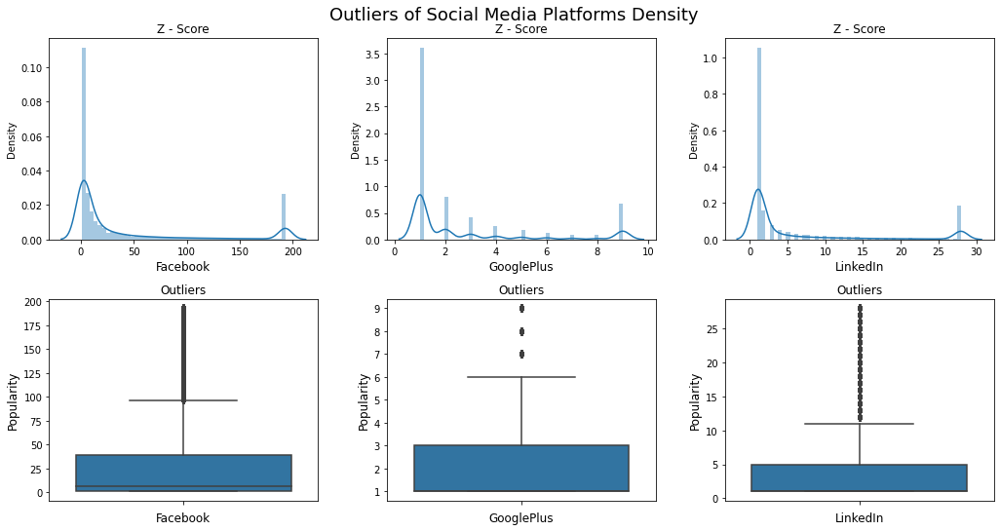

In [ ]:
show_outliers(master_df, True)

In [ ]:
#Standardize data
scaler = StandardScaler()

for source in sources:
    master = master_df[source].apply(lambda x:x if x!=(0) else np.nan)
    master_df[f'{source}_scaled'] = scaler.fit_transform(master.values.reshape(-1,1))

    master_df[f'{source}_scaled'].fillna(0,inplace=True)
    master_df[source].fillna(0,inplace=True)

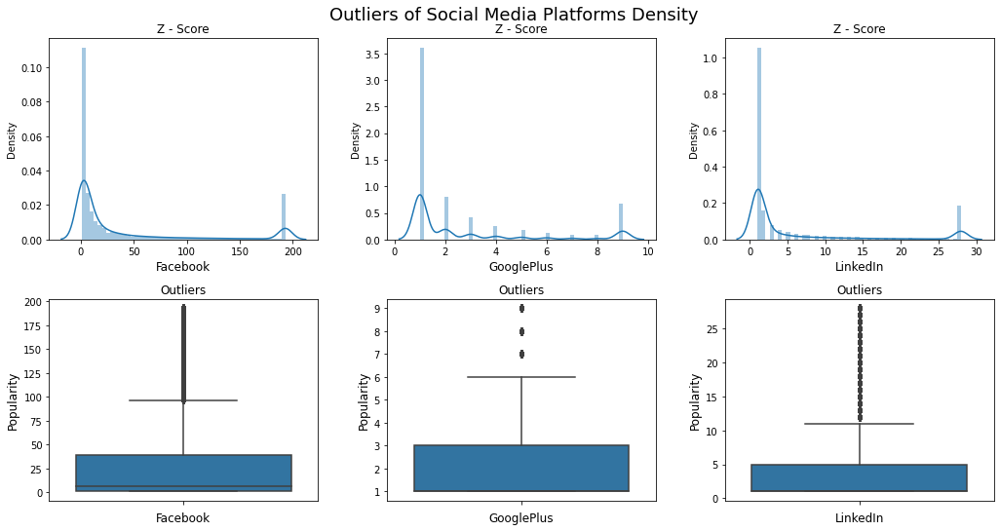

In [ ]:
show_outliers(master_df)

In [ ]:
master_df.tail()

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled
93234,61851.0,Stocks rise as investors key in on US economy ...,The June employment report is viewed as a cruc...,MarketWatch,economy,2016-07-07,0.104284,0.044943,1.0,4.0,6.0,15:31:05,Thursday,-0.604085,0.508931,0.020927
93235,61865.0,Russian PM proposes to use conservative and to...,"In addition, establish stimulating economic po...",TASS,economy,2016-07-07,0.072194,0.000000,1.0,1.0,2.0,15:31:10,Thursday,-0.604085,-0.617774,-0.435146
93236,104793.0,Palestinian Government Uses Foreign Aid To Pay...,The Palestinian government spends nearly $140 ...,Daily Caller,palestine,2016-07-07,0.291667,-0.139754,6.0,2.0,1.0,15:38:26,Thursday,-0.523270,-0.242206,-0.549165
93237,104794.0,Palestine Youth Orchestra prepares for first U...,Palestine Youth Orchestra prepares for first U...,Ahram Online,palestine,2016-07-07,0.121534,0.092313,1.0,1.0,1.0,15:59:22,Thursday,-0.604085,-0.617774,-0.549165
93238,61870.0,Sausalito businesswoman wins $10000 in Microso...,"Goldstein, the proprietor of the TG Travel Gro...",East Bay Times,microsoft,2016-07-07,0.000000,0.054554,1.0,2.0,1.0,16:16:11,Thursday,-0.604085,-0.242206,-0.549165


In [ ]:
master_df.reset_index(inplace=True, drop=True)
master_df.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled
0,80690.0,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",Bloomberg,palestine,2016-02-28,0.000000,-0.005906,1.0,1.0,1.0,14:03:00,Sunday,-0.604085,-0.617774,-0.549165
1,81052.0,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",Bloomberg,palestine,2016-03-01,0.000000,0.048546,1.0,1.0,1.0,09:29:00,Tuesday,-0.604085,-0.617774,-0.549165
2,80994.0,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",Bloomberg,palestine,2016-03-01,-0.243068,0.048546,1.0,1.0,1.0,00:15:00,Tuesday,-0.604085,-0.617774,-0.549165
3,311.0,Microsoft offering £100 discount on original B...,Just ahead of the market rollout of Microsoft'...,International Business Times via Yahoo UK & Ir...,microsoft,2015-11-08,0.000000,-0.132812,1.0,1.0,1.0,05:25:00,Sunday,-0.604085,-0.617774,-0.549165
4,252.0,Economy to improve though no change in last 6 ...,"&quot;In the coming six months, there seems to...",IANS India Private Limited/Yahoo India News vi...,economy,2015-11-08,-0.082022,0.205537,1.0,1.0,1.0,05:40:00,Sunday,-0.604085,-0.617774,-0.549165


In [ ]:
master_df['SentimentTitle_Category'] = master_df['SentimentTitle'].apply(lambda x: 'neutral' if x == 0 else 'positive' if x > 0 else 'negative')

master_df['SentimentHeadline_Category'] = master_df['SentimentHeadline'].apply(lambda x: 'neutral' if x == 0 else 'positive' if x > 0 else 'negative')
master_df.head()

,IDLink,Title,Headline,Source,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,SentimentTitle_Category,SentimentHeadline_Category
0,80690.0,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",Bloomberg,palestine,2016-02-28,0.000000,-0.005906,1.0,1.0,1.0,14:03:00,Sunday,-0.604085,-0.617774,-0.549165,neutral,negative
1,81052.0,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",Bloomberg,palestine,2016-03-01,0.000000,0.048546,1.0,1.0,1.0,09:29:00,Tuesday,-0.604085,-0.617774,-0.549165,neutral,positive
2,80994.0,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",Bloomberg,palestine,2016-03-01,-0.243068,0.048546,1.0,1.0,1.0,00:15:00,Tuesday,-0.604085,-0.617774,-0.549165,negative,positive
3,311.0,Microsoft offering £100 discount on original B...,Just ahead of the market rollout of Microsoft'...,International Business Times via Yahoo UK & Ir...,microsoft,2015-11-08,0.000000,-0.132812,1.0,1.0,1.0,05:25:00,Sunday,-0.604085,-0.617774,-0.549165,neutral,negative
4,252.0,Economy to improve though no change in last 6 ...,"&quot;In the coming six months, there seems to...",IANS India Private Limited/Yahoo India News vi...,economy,2015-11-08,-0.082022,0.205537,1.0,1.0,1.0,05:40:00,Sunday,-0.604085,-0.617774,-0.549165,negative,positive


In [ ]:
def show_no_of_news_sentiment_title(df):
    print('******** No. of News items of SentimentTitle ********')
    print(df.SentimentTitle_Category.value_counts(),'\n')

    plt.figure(figsize=(10,8))
    df.SentimentTitle_Category.value_counts().plot(kind='bar')
    plt.title('News Items Distribution of Each Sentiment in Title', fontdict={'size':20})
    plt.xlabel('Sentiment Type',fontdict={'size':15})
    plt.ylabel('No. of News Items',fontdict={'size':15})

def show_no_of_news_sentiment_headline(df):
    print('******** No. of News items of SentimentHeadline ********')
    print(df.SentimentHeadline_Category.value_counts(),'\n')

    plt.figure(figsize=(10,8))
    df.SentimentHeadline_Category.value_counts().plot(kind='bar')
    plt.title('News Items Distribution of Each Sentiment in Headline', fontdict={'size':20})
    plt.xlabel('Sentiment Type',fontdict={'size':15})
    plt.ylabel('No. of News Items',fontdict={'size':15})


******** No. of News items of SentimentTitle ********
negative    35484
positive    34377
neutral     17617
Name: SentimentTitle_Category, dtype: int64 



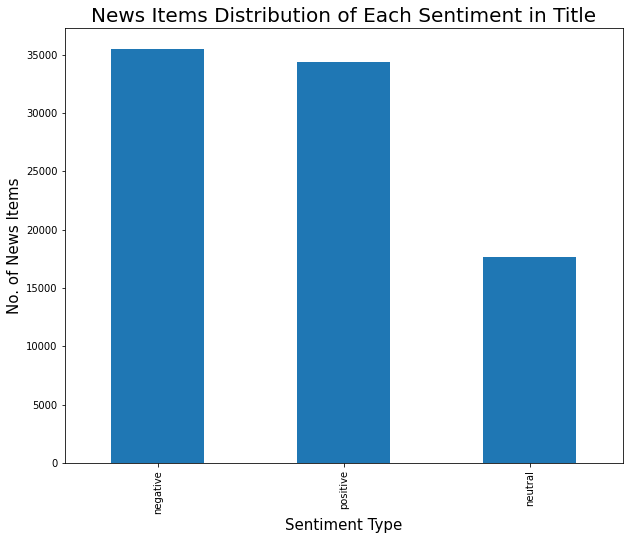

In [ ]:
show_no_of_news_sentiment_title(master_df)

******** No. of News items of SentimentHeadline ********
negative    49452
positive    35328
neutral      2698
Name: SentimentHeadline_Category, dtype: int64 



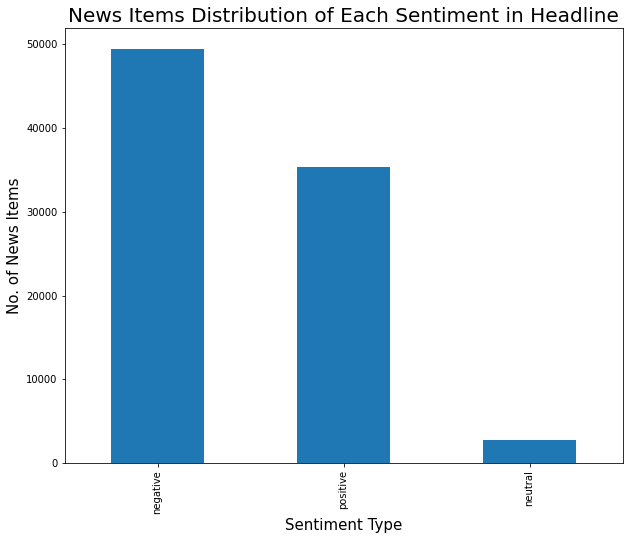

In [ ]:
show_no_of_news_sentiment_headline(master_df)

In [ ]:
# Categorizing Source Columns

# master_df['Source'].value_counts().unique()
# len(master_df['Source'].value_counts().unique())
# print(list(master_df['Source'].unique()))
# np.median(master_df['Source'].value_counts().unique())
# master_df.Source.value_counts().describe()
# plt.boxplot(master_df.Source.value_counts())
# master_df.Source.value_counts()
# source_df = pd.DataFrame(master_df['Source'].value_counts())
# len(source_df[source_df['Source']==1].index) # A
# len(source_df[source_df['Source']==2].index) #B
# len(source_df[(source_df['Source']>2) & (source_df['Source']<=8)].index) # C
# len(source_df[source_df['Source']>8].index) # D
# master_df.Topic.unique()
# master_df['Source_type'] = master_df['Source'].apply(lambda x : 'A' if source_df['Source'][x]==1 else ('B' if source_df['Source'][x]==2 else ('C' if (source_df['Source'][x] > 2 and source_df['Source'][x] <= 8) else x )))
# master_df[(master_df.Source_type != 'A') & (master_df.Source_type != 'B') & (master_df.Source_type != 'C') ].Source_type.value_counts().describe()

q1 = np.percentile(master_df['Source'].value_counts().unique(), 25, interpolation = 'midpoint')
q2 = np.percentile(master_df['Source'].value_counts().unique(), 50, interpolation = 'midpoint')
q3 = np.percentile(master_df['Source'].value_counts().unique(), 75, interpolation = 'midpoint')
print('----- Quaters -----')
print('> q1: ',q1,'\n> q2:',q2,'\n> q3:',q3)


source_df = pd.DataFrame(master_df['Source'].value_counts())
master_df['Source_type'] = master_df['Source'].apply(lambda x: 'A' if source_df['Source'][x]<=q1 else 'B' 
                                                     if source_df['Source'][x]<=q2 else 'C' if source_df['Source'][x]<=q3 else 'D')
master_df.drop(columns=['Source'], inplace = True)
master_df.head()

----- Quaters -----
> q1:  56.5 
> q2: 123.5 
> q3: 263.5


,IDLink,Title,Headline,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,PublishTime,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,SentimentTitle_Category,SentimentHeadline_Category,Source_type
0,80690.0,"Monday, 29 Feb 2016","RAMALLAH, February 25, 2016 (WAFA) - Palestine...",palestine,2016-02-28,0.000000,-0.005906,1.0,1.0,1.0,14:03:00,Sunday,-0.604085,-0.617774,-0.549165,neutral,negative,D
1,81052.0,"Monday, 29 Feb 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",palestine,2016-03-01,0.000000,0.048546,1.0,1.0,1.0,09:29:00,Tuesday,-0.604085,-0.617774,-0.549165,neutral,positive,D
2,80994.0,"Tuesday, 1 Mar 2016","RAMALLAH, February 29, 2016 (WAFA) - The Gover...",palestine,2016-03-01,-0.243068,0.048546,1.0,1.0,1.0,00:15:00,Tuesday,-0.604085,-0.617774,-0.549165,negative,positive,D
3,311.0,Microsoft offering £100 discount on original B...,Just ahead of the market rollout of Microsoft'...,microsoft,2015-11-08,0.000000,-0.132812,1.0,1.0,1.0,05:25:00,Sunday,-0.604085,-0.617774,-0.549165,neutral,negative,C
4,252.0,Economy to improve though no change in last 6 ...,"&quot;In the coming six months, there seems to...",economy,2015-11-08,-0.082022,0.205537,1.0,1.0,1.0,05:40:00,Sunday,-0.604085,-0.617774,-0.549165,negative,positive,A


******** No. of News items in Sources ********
A    31847
D    28929
C    14637
B    12065
Name: Source_type, dtype: int64 



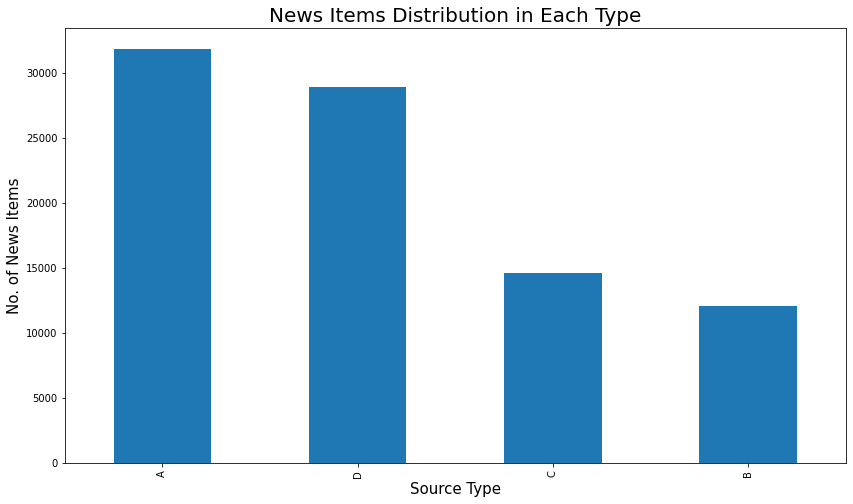

In [ ]:
def show_news_distribution_in_sources(df):
    print('******** No. of News items in Sources ********')
    print(df.Source_type.value_counts(),'\n')

    plt.figure(figsize=(14,8))
    df.Source_type.value_counts().plot(kind='bar')
    plt.title('News Items Distribution in Each Type', fontdict={'size':20})
    plt.xlabel('Source Type',fontdict={'size':15})
    plt.ylabel('No. of News Items',fontdict={'size':15})

show_news_distribution_in_sources(master_df)

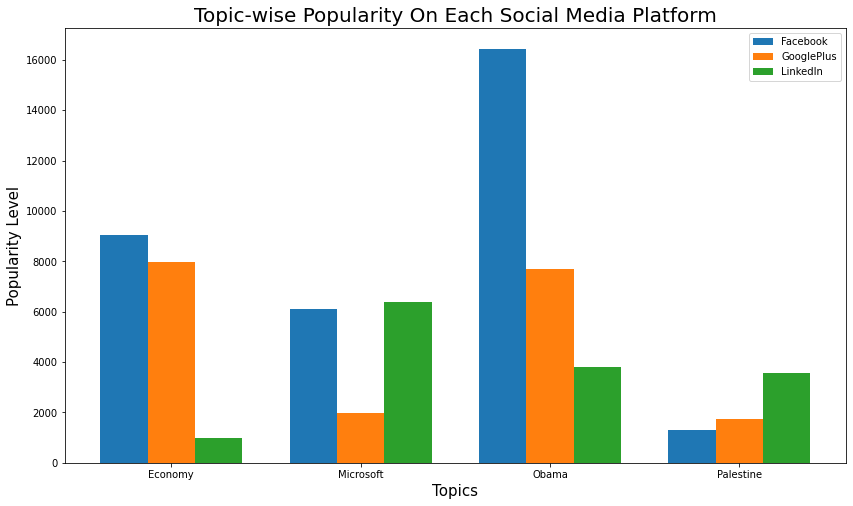

In [ ]:
def show_popularities(df):
    facebook = abs(df.groupby(['Topic'])['Facebook_scaled'].sum())
    googleplus = abs(df.groupby(['Topic'])['GooglePlus_scaled'].sum())
    linkedin = abs(df.groupby(['Topic'])['LinkedIn_scaled'].sum())

    ind = np.arange(len(topics)) 


    plt.figure(figsize=(14,8))
    plt.bar(ind-0.25,facebook,width=0.25,label='Facebook')
    plt.bar(ind,googleplus,width=0.25,label='GooglePlus')
    plt.bar(ind+0.25,linkedin,width=0.25,label='LinkedIn')

    plt.xticks(ind, topics)
    plt.legend()
    plt.title('Topic-wise Popularity On Each Social Media Platform', fontdict={'size':20})
    plt.xlabel('Topics', fontdict={'size':15})
    plt.ylabel('Popularity Level', fontdict={'size':15})
    plt.show()

show_popularities(master_df)

In [ ]:
# def show_correlation_plot_of_dependent_features(df):
#     temp_df = df.copy()
#     temp_df['Facebook'] = np.log10(df['Facebook'][df['Facebook']>0])
#     temp_df['GooglePlus'] = np.log10(df['GooglePlus'][df['GooglePlus']>0])
#     temp_df['LinkedIn'] = np.log10(df['LinkedIn'][df['LinkedIn']>0])

#     returns_fig = sns.PairGrid(temp_df[['Facebook','GooglePlus','LinkedIn']])

#     returns_fig.map_upper(sns.scatterplot, color="purple", alpha=0.3)
#     returns_fig.map_lower(sns.kdeplot,cmap='cool_d')
#     returns_fig.map_diag(sns.histplot,bins=20,color=".3")
#     plt.title('Correlation Between Dependent Features', fontdict={'size':20})

# show_correlation_plot_of_dependent_features(master_df)

In [ ]:
# from statistics import mode
# for col in df['Facebook_Economy'].loc[:,'TS1':].columns:
#     print(mode(df['Facebook_Economy'].loc[:,'TS1':][col]))
# for col in df['Facebook_Economy'].loc[:,'TS1':].columns:
#     print(np.mean(df['Facebook_Economy'].loc[:,'TS1':][col]))


def mean_cal(data):
    count = len(data)-data.count(0)
    if count==0:
        return 0
    avg = (sum(data))/count

    return avg

In [ ]:
rows = df['Facebook_Economy'].loc[:,'TS1':].columns

def mean_news_popularity(df_dict, social_media, rows):
    mean_df = pd.DataFrame(index = rows, columns = ['Economy','Microsoft','Obama','Palestine'])
    mean_df['Economy'] = df_dict[f'{social_media}_Economy'].apply(lambda x: mean_cal(list(x)))
    mean_df['Microsoft'] = df_dict[f'{social_media}_Microsoft'].apply(lambda x: mean_cal(list(x)))
    mean_df['Obama'] = df_dict[f'{social_media}_Obama'].apply(lambda x: mean_cal(list(x)))
    mean_df['Palestine'] = df_dict[f'{social_media}_Palestine'].apply(lambda x: mean_cal(list(x)))

    return mean_df

def show_news_popularity_with_time(df, Platform, rows):
    sns.set(rc={'figure.figsize':(25,7)})
    sns.lineplot(data = mean_news_popularity(df, Platform, rows), dashes=False)
    plt.title(f'News Popularity With Time On {Platform}',fontdict={'size':20})
    plt.xlabel('Topics',fontdict={'size':15})
    plt.ylabel('Popularity',fontdict={'size':15})

def compare_news_popularity(df, Platform, rows):
    sns.set(rc={'figure.figsize':(10,7)})
    sns.barplot(data = mean_news_popularity(df, Platform, rows))
    plt.title(f'Popularity Comparison On {Platform}',fontdict={'size':20})
    plt.xlabel('Topics',fontdict={'size':15})
    plt.ylabel('Popularity',fontdict={'size':15})

In [ ]:
Platform = "GooglePlus" #@param ["Select Social Media", "Facebook", "GooglePlus", "LinkedIn"]

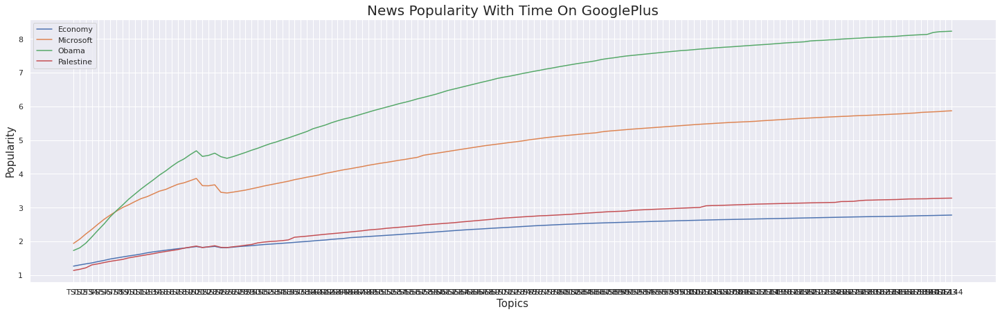

In [ ]:
show_news_popularity_with_time(df, Platform, rows)

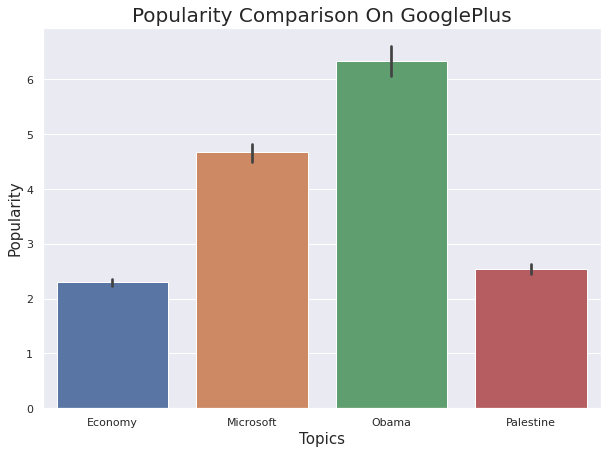

In [ ]:
compare_news_popularity(df, Platform, rows)

In [ ]:
def mean_suitable_platform(df_dict, topic, rows):
    mean_df = pd.DataFrame(index=rows, columns = ['LinkedIn','GooglePlus','Facebook'])
    mean_df['LinkedIn'] = df_dict[f'LinkedIn_{topic}'].apply(lambda x: mean_cal(list(x)))
    mean_df['GooglePlus'] = df_dict[f'GooglePlus_{topic}'].apply(lambda x: mean_cal(list(x)))
    mean_df['Facebook'] = df_dict[f'Facebook_{topic}'].apply(lambda x: mean_cal(list(x)))

    return mean_df

def show_best_platform_for_news(df_dict, topic, rows):
    sns.set(rc={'figure.figsize':(25,7)})
    sns.lineplot(data = mean_suitable_platform(df_dict, topic, rows), dashes=False)
    plt.title(f'Best Social Media for {topic}',fontdict={'size':20})
    plt.xlabel('Social Media',fontdict={'size':15})
    plt.ylabel('Popularity',fontdict={'size':15})

def compare_platforms(df_dict, topic, rows):
    sns.set(rc={'figure.figsize':(10,7)})
    sns.barplot(data = mean_suitable_platform(df_dict, topic, rows))
    plt.title(f'Platform Comparison for {topic}',fontdict={'size':20})
    plt.xlabel('Social Media',fontdict={'size':15})
    plt.ylabel('Popularity',fontdict={'size':15})


In [ ]:
Topic = "Economy" #@param ["Select Social Media", "Economy", "Microsoft", "Obama","Palestine"]

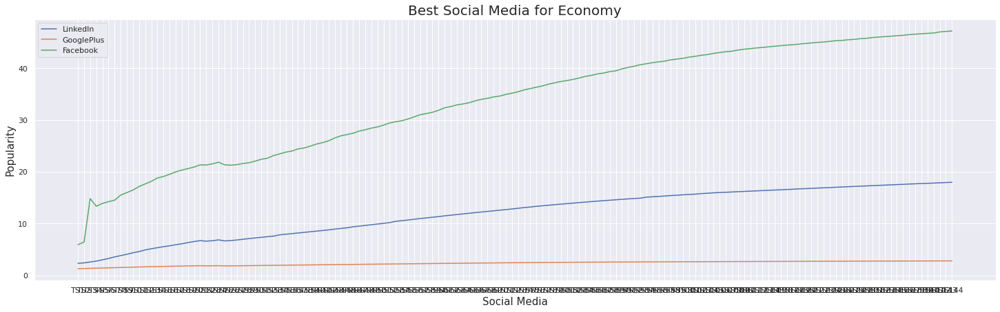

In [ ]:
show_best_platform_for_news(df, Topic, rows)

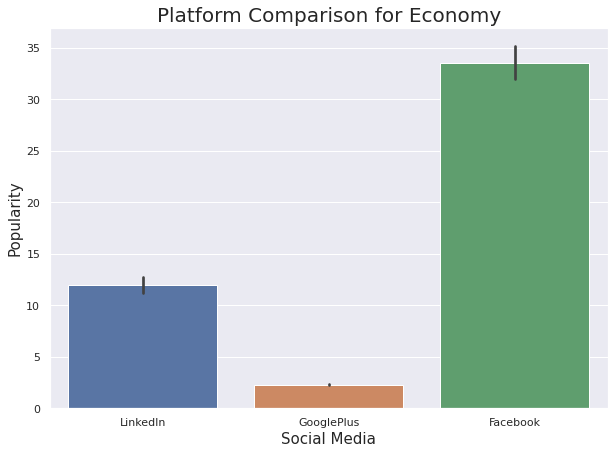

In [ ]:
compare_platforms(df, Topic, rows)

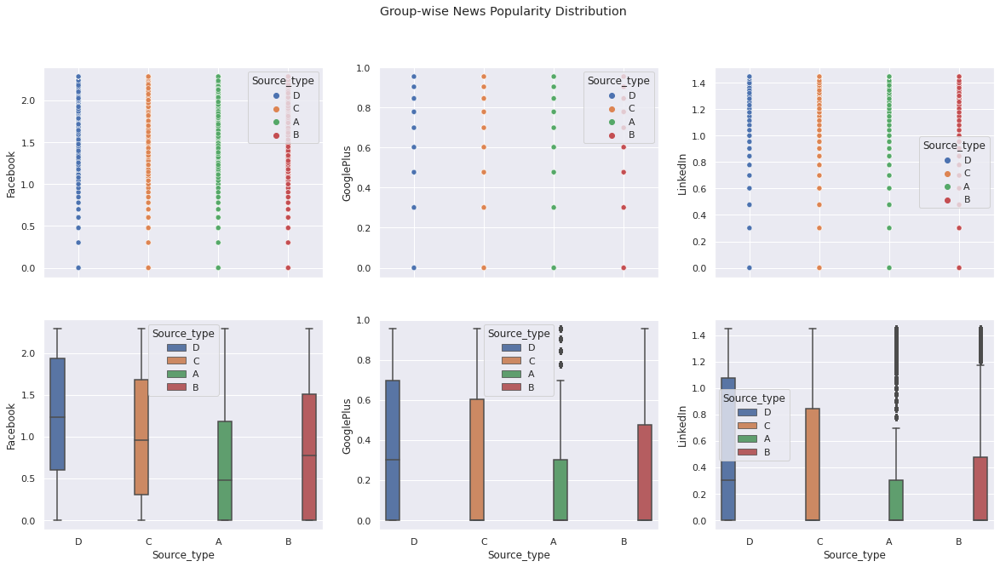

In [ ]:
def show_groupwise_popularity_distribution(df):
    temp_df = df.copy()
    temp_df['Facebook'] = np.log10(temp_df['Facebook'][temp_df['Facebook']>0])
    temp_df['GooglePlus'] = np.log10(temp_df['GooglePlus'][temp_df['GooglePlus']>0])
    temp_df['LinkedIn'] = np.log10(temp_df['LinkedIn'][temp_df['LinkedIn']>0])

    fig, axes = plt.subplots(2, 3, sharex=True, figsize=(20,10))
    fig.suptitle('Group-wise News Popularity Distribution', fontdict={'size':20})
    sns.scatterplot(ax = axes[0,0],x="Source_type",y="Facebook", data=temp_df,hue='Source_type')
    sns.scatterplot(ax = axes[0,1],x="Source_type",y="GooglePlus", data=temp_df,hue='Source_type')
    sns.scatterplot(ax = axes[0,2],x="Source_type",y="LinkedIn", data=temp_df, hue='Source_type')

    sns.boxplot(ax = axes[1,0],x="Source_type",y="Facebook", data=temp_df,hue='Source_type')
    sns.boxplot(ax = axes[1,1],x="Source_type",y="GooglePlus", data=temp_df,hue='Source_type')
    sns.boxplot(ax = axes[1,2],x="Source_type",y="LinkedIn", data=temp_df, hue='Source_type')

show_groupwise_popularity_distribution(master_df)

In [ ]:
def mean_source_popularity(df, df_dict, platform, rows):
    source_a_df, source_b_df, source_c_df, source_d_df = df[df['Source_type'] == 'A'],df[df['Source_type'] == 'B'],df[df['Source_type'] == 'C'],df[df['Source_type'] == 'D']
    
    platform_df = df_dict[f'{platform}_Economy'].append(df_dict[f'{platform}_Microsoft'].append(df_dict[f'{platform}_Obama'].append(df_dict[f'{platform}_Palestine'])))

    pt_sa = source_a_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    pt_sb = source_b_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    pt_sc = source_c_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    pt_sd = source_d_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')

    pt_sa = pt_sa.loc[:,'TS1':]
    pt_sb = pt_sb.loc[:,'TS1':]
    pt_sc = pt_sc.loc[:,'TS1':]
    pt_sd = pt_sd.loc[:,'TS1':]


    mean_df = pd.DataFrame(index=rows, columns = ['Source_A','Source_B','Source_C', 'Source_D'])
    mean_df.Source_A = pt_sa.apply(lambda x: mean_cal(list(x)))
    mean_df.Source_B = pt_sb.apply(lambda x: mean_cal(list(x)))
    mean_df.Source_C = pt_sc.apply(lambda x: mean_cal(list(x)))
    mean_df.Source_D = pt_sd.apply(lambda x: mean_cal(list(x)))

    return mean_df

def show_source_popularity_with_time(df, df_dict, platform, rows):
    sns.set(rc={'figure.figsize':(25,7)})
    sns.lineplot(data = mean_source_popularity(df, df_dict, platform, rows), dashes=False)
    plt.title(f'Source-wise Popularity on {platform}',fontdict={'size':20})
    plt.xlabel('Time',fontdict={'size':15})
    plt.ylabel('Popularity',fontdict={'size':15})

def show_source_popularity_comparison(df, df_dict, platform, rows):

    fig, axes = plt.subplots(1, 2, sharex=True, figsize=(20,8))
    df1 = mean_source_popularity(df, df_dict, platform, rows)
    plt.suptitle(f'Popularity Comparison on {platform}',fontdict={'size':20})
    sns.barplot(ax = axes[0],data = df1)
    sns.boxenplot(ax = axes[1],data = df1)
    

In [ ]:
Platform = "Facebook" #@param ["Select Social Media", "Facebook", "GooglePlus", "LinkedIn"]

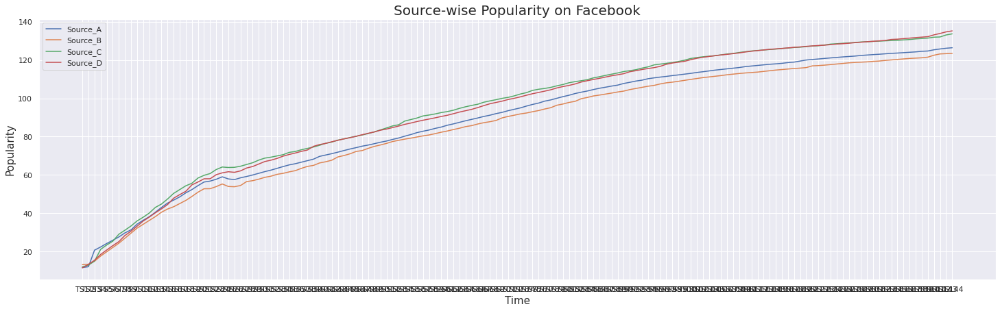

In [ ]:
show_source_popularity_with_time(master_df, df, Platform, rows)

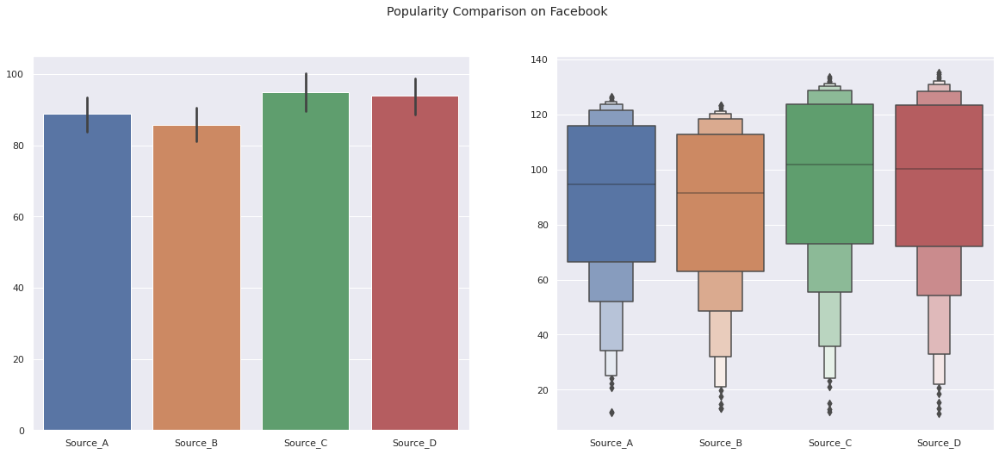

In [ ]:
show_source_popularity_comparison(master_df, df, Platform, rows)

In [ ]:
def seperate_news_for_topic(df):

    obama_news = df[df['Topic'] == 'obama']
    microsoft_news = df[df['Topic'] == 'microsoft']
    economy_news = df[df['Topic'] == 'economy']
    palestine_news = df[df['Topic'] == 'palestine']

    return (obama_news, microsoft_news, economy_news, palestine_news)

topic_tuple = seperate_news_for_topic(master_df)
obama_news = topic_tuple[0]
microsoft_news = topic_tuple[1]
economy_news = topic_tuple[2]
palestine_news = topic_tuple[3]

In [ ]:
 group_obama = obama_news.groupby('PublishDate').count()
 group_microsoft = microsoft_news.groupby('PublishDate').count()
 group_economy = economy_news.groupby('PublishDate').count()
 group_palestine = palestine_news.groupby('PublishDate').count()

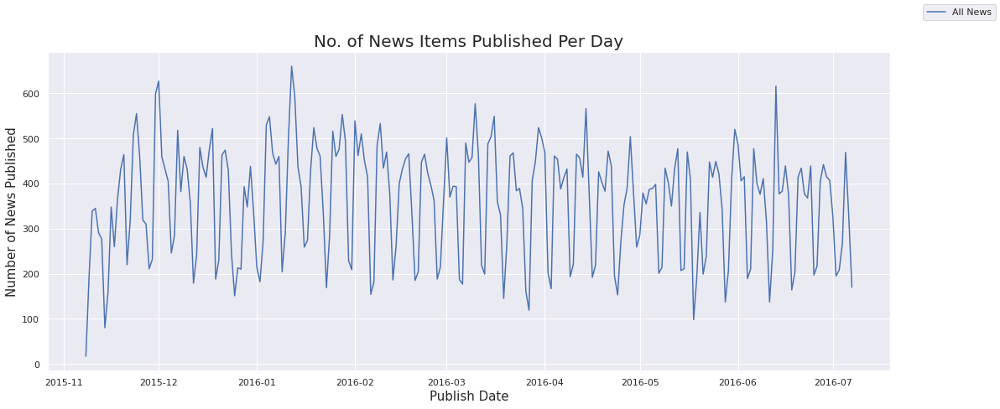

In [ ]:
def plot_topic_date_vs_news_count(df):
    group_news_count = df.groupby('PublishDate').count()
    ax = plt.figure(figsize=(18,7))
    plt.plot(group_news_count.index, group_news_count['SentimentHeadline'], label='All News')
    ax.legend(ncol=2, loc="upper right", frameon=True)
    plt.title('No. of News Items Published Per Day',fontdict={'size':20})
    plt.xlabel('Publish Date',fontdict={'size':15})
    plt.ylabel('Number of News Published',fontdict={'size':15})

plot_topic_date_vs_news_count(master_df)
  

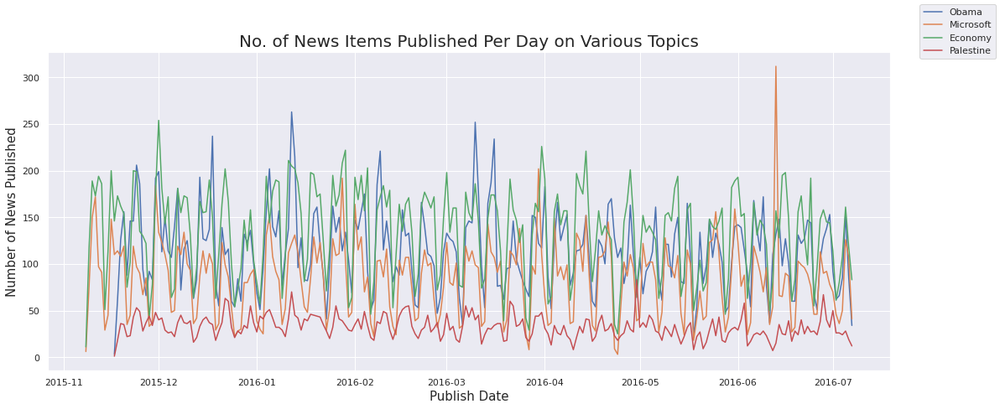

In [ ]:
def plot_topic_date_vs_news_count(group_obama, group_microsoft, group_economy, group_palestine):
    ax = plt.figure(figsize=(18,7))
    plt.plot(group_obama.index, group_obama['SentimentHeadline'], label='Obama')
    plt.plot(group_microsoft.index, group_microsoft['SentimentHeadline'], label='Microsoft')
    plt.plot(group_economy.index, group_economy['SentimentHeadline'] , label='Economy')
    plt.plot(group_palestine.index, group_palestine['SentimentHeadline'], label='Palestine')
    plt.title('No. of News Items Published Per Day on Various Topics',fontdict={'size':20})
    plt.xlabel('Publish Date',fontdict={'size':15})
    plt.ylabel('Number of News Published',fontdict={'size':15})
    ax.legend()

plot_topic_date_vs_news_count(group_obama, group_microsoft, group_economy, group_palestine)

In [ ]:
def plot_news_vs_publish_date_month_wise(News_Final, sd, ed):
    startdate = pd.to_datetime(sd).date()
    enddate = pd.to_datetime(ed).date()
    news_final_new1 = News_Final[(News_Final['PublishDate']>=startdate) & (News_Final['PublishDate']<=enddate)] 
    group_news1 = news_final_new1.groupby('PublishDate' ).count()
    mean_group_news1  = news_final_new1.groupby('PublishDate').mean()

    ax = plt.figure(figsize=(18,7))
    plt.plot(group_news1.index, group_news1['SentimentHeadline'])
    plt.plot(mean_group_news1.index, (mean_group_news1['Facebook']), label='Facebook')
    plt.plot(mean_group_news1.index, (mean_group_news1['GooglePlus']), label='GooglePlus')
    plt.plot(mean_group_news1.index, (mean_group_news1['LinkedIn']), label='LinkedIn')
    plt.title('No. of News Items Publish Per Month',fontdict={'size':20})
    plt.xlabel('Publish Date',fontdict={'size':15})
    plt.ylabel('Number of News',fontdict={'size':15})
    ax.legend(ncol=2, loc="lower right", frameon=True)


In [ ]:
Start_Date = '2015-12-12' #@param {type:"date"}
End_Date = '2016-02-12' #@param {type:"date"}

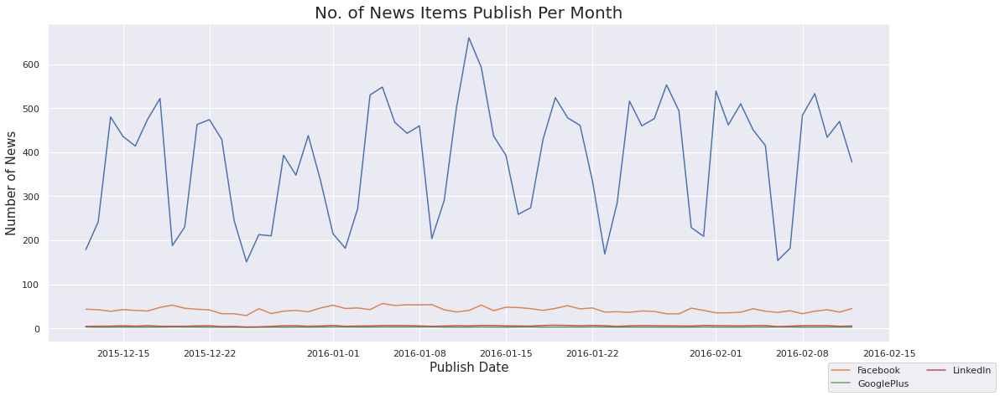

In [ ]:
plot_news_vs_publish_date_month_wise(master_df, str(Start_Date),str(End_Date))

In [ ]:
def get_master_tsdf_min_after_pub(df, tsdf_name):
    # df['SOP'] = df.apply(lambda x:  sum([a for a in x[1:] if a>0]), axis = 1)

    social_med = tsdf_name.split('_')[0]
    columns_to_delete = df.columns[1:-1]
    tsdf_sum_fb = df.drop(columns=columns_to_delete)

    
    merge_master_tsdf_sum_fb = pd.merge(master_df[['IDLink','Topic','PublishDate', 'PublishTime', social_med]], tsdf_sum_fb, on ='IDLink')

    df['MinutesAfterPublication'] = df.apply(lambda x:  sum([20 for a in x[1:] if a==0]), axis = 1)
    tsdf_map_fb = df.drop(columns=columns_to_delete)

    merge_master_tsdf_map_fb = pd.merge(master_df[['IDLink','Topic','PublishDate', 'PublishTime', social_med]], tsdf_map_fb, on ='IDLink')
    # merge_master_tsdf_map_fb = merge_master_tsdf_map_fb[merge_master_tsdf_map_fb[social_med] != -1]

    merge_master_tsdf_map_fb['PublishHour'] = merge_master_tsdf_map_fb['PublishTime'].apply(lambda x: str(x)[0:2])
    merge_master_tsdf_map_fb=merge_master_tsdf_map_fb.sort_values(by='PublishHour')
    return merge_master_tsdf_map_fb

def show_news_landed_on_platform_after_published(df_dict, Platform_Topic):
    merge_master_tsdf_map_fb = get_master_tsdf_min_after_pub(df[Platform_Topic], Platform_Topic)
    ax = plt.figure(figsize=(18,7))
    sns.lineplot(data=merge_master_tsdf_map_fb, x = 'PublishHour', y= 'MinutesAfterPublication')


In [ ]:
Platform_Topic = "LinkedIn_Economy" #@param ["Select Social Media", "Facebook_Economy","Facebook_Microsoft","Facebook_Obama","Facebook_Palestine","GooglePlus_Economy","GooglePlus_Microsoft","GooglePlus_Obama","GooglePlus_Palestine","LinkedIn_Economy","LinkedIn_Microsoft","LinkedIn_Obama","LinkedIn_Palestine"]

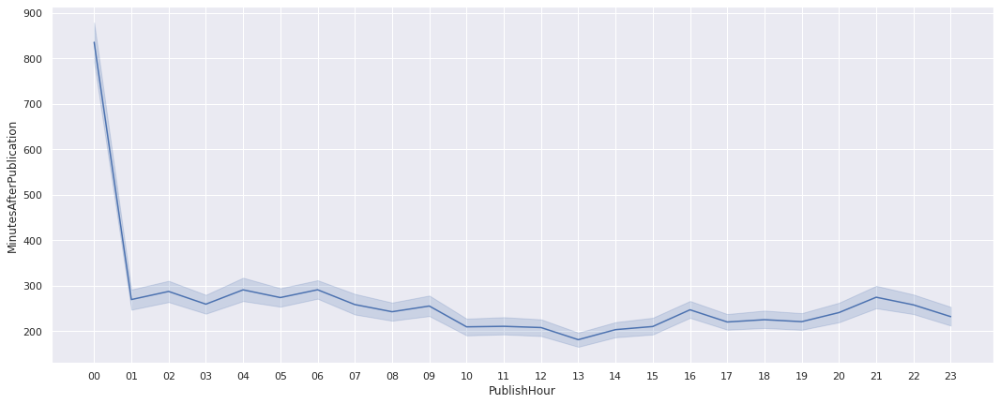

In [ ]:
show_news_landed_on_platform_after_published(df, Platform_Topic)

In [ ]:
def plot_hour_vs_popularity(df, social_media):
  df['Hour'] = df['PublishTime'].apply(lambda x: str(x)[0:2])
  df=df.sort_values(by='Hour')
  ax = plt.figure(figsize=(18,7))
  sns.lineplot(data=df, y = social_media, x= 'Hour')

In [ ]:
Platform = "Facebook" #@param ["Select Social Media", "Facebook", "GooglePlus", "LinkedIn"]

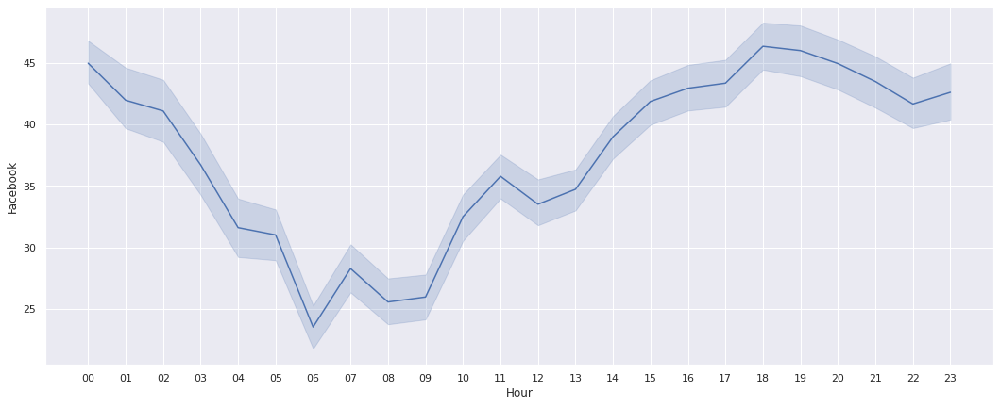

In [ ]:
plot_hour_vs_popularity(master_df,Platform)

In [ ]:
def plot_sentiment_vs_news_count(palestine_news, obama_news, microsoft_news, economy_news, sentiment_type ):
  fig, axes = plt.subplots(2, 2, sharex=True,figsize=(20, 10))

  sns.histplot(ax= axes[0][0],data = palestine_news[sentiment_type], kde=True, color='green')
  axes[0][0].set_title('Palestine News',fontdict={'fontsize': '10', 'fontweight' : 'bold'})

  sns.histplot(ax= axes[0][1],data = obama_news[sentiment_type], kde=True, color='green')
  axes[0][1].set_title('Obama News',fontdict={'fontsize': '10', 'fontweight' : 'bold'})


  sns.histplot(ax= axes[1][0],data = microsoft_news[sentiment_type], kde=True, color='green')
  axes[1][0].set_title('Microsoft News',fontdict={'fontsize': '10', 'fontweight' : 'bold'})


  sns.histplot(ax= axes[1][1],data = economy_news[sentiment_type], kde=True, color='green')
  axes[1][1].set_title('Economy News',fontdict={'fontsize': '10', 'fontweight' : 'bold'})


In [ ]:
Sentiment_Type = "SentimentTitle" #@param ["Select Type", "SentimentHeadline", "SentimentTitle"]


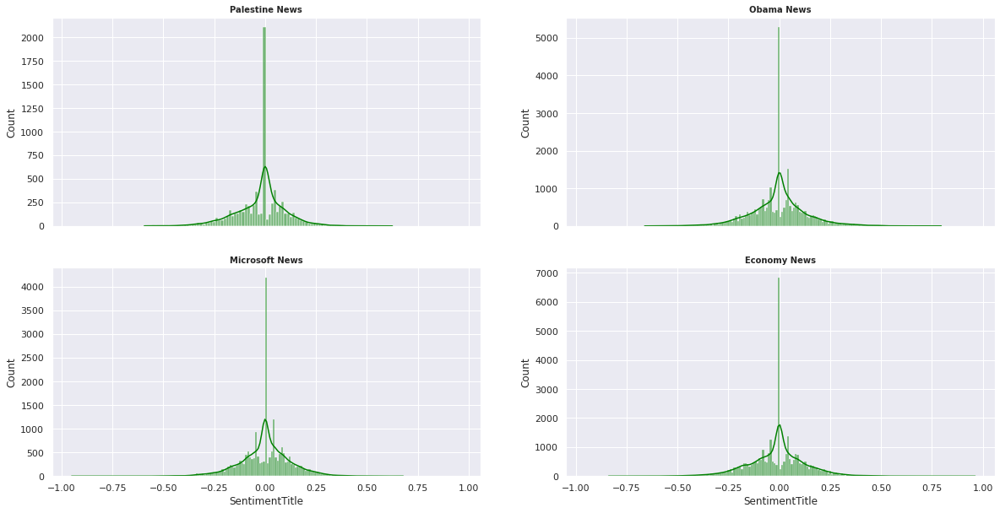

In [ ]:
plot_sentiment_vs_news_count(palestine_news, obama_news, microsoft_news, economy_news, Sentiment_Type )

In [ ]:
def show_relation_between_sentiment_and_dependent_features(df, sentimentType, feature):
    df1 = df[['Facebook', 'GooglePlus','LinkedIn','Topic', 'SentimentTitle','SentimentHeadline']]
    # df1['Facebook'] = np.log10(df['Facebook'][df['Facebook']>0])
    # df1['GooglePlus'] = np.log10(df['GooglePlus'][df['GooglePlus']>0])
    # df1['LinkedIn'] = np.log10(df['LinkedIn'][df['LinkedIn']>0])

    fig = px.scatter(df1, x=sentimentType, y=feature, color="Topic", symbol="Topic", title=f'Popularity Based on {Sentiment_Type}')
    fig.show()

def show_sentiment_correlation(df):
    fig = px.scatter(df, x="SentimentTitle", y="SentimentHeadline", facet_col="Topic", title='Correlation Between Title Sentiment and Headline Sentiment',facet_row="Source_type", trendline="ols",trendline_color_override="red")
    fig.show()

def show_sentiment_heatmap(df):
    sns.heatmap(master_df[['SentimentHeadline','SentimentTitle','Facebook','GooglePlus','LinkedIn']].corr(),annot=True)
    plt.title('Sentiment HeatMap', fontdict={'size':20})

In [ ]:
Sentiment_Type = "SentimentTitle" #@param ["Select Type", "SentimentHeadline", "SentimentTitle"]
Platform = "LinkedIn" #@param ["Select Social Media", "Facebook", "GooglePlus", "LinkedIn"]

In [ ]:
show_relation_between_sentiment_and_dependent_features(master_df, Sentiment_Type, Platform)

In [ ]:
show_sentiment_correlation(master_df)

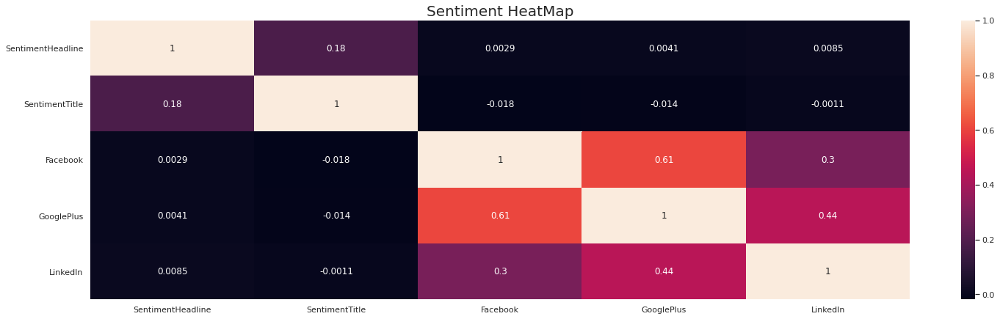

In [ ]:
show_sentiment_heatmap(master_df)

In [ ]:
 def senti_mean(df, df_dict, platform, rows):
    senti_p_df, senti_neu_df, senti_n_df = df[df['SentimentTitle_Category'] == 'positive'],df[df['SentimentTitle_Category'] == 'neutral'],df[df['SentimentTitle_Category'] == 'negative']
    platform_df = df_dict[f'{platform}_Economy'].append(df_dict[f'{platform}_Microsoft'].append(df_dict[f'{platform}_Obama'].append(df_dict[f'{platform}_Palestine'])))

    spos = senti_p_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    sneu = senti_neu_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')
    sneg = senti_n_df.join(platform_df, on = 'IDLink',how = 'inner',lsuffix='l',rsuffix='r')

    spos = spos.loc[:,'TS1':]
    sneu = sneu.loc[:,'TS1':]
    sneg = sneg.loc[:,'TS1':]


    senti_mean_df = pd.DataFrame(index=rows, columns = ['Positive','Neutral','Negative'])
    senti_mean_df.Positive = spos.apply(lambda x: mean_cal(list(x)))
    senti_mean_df.Neutral = sneu.apply(lambda x: mean_cal(list(x)))
    senti_mean_df.Negative = sneg.apply(lambda x: mean_cal(list(x)))

    return senti_mean_df

def show_sentiment_popularity_trend(df, df_dict, platform, rows):
    sns.set(rc={'figure.figsize':(25,7)})
    sns.lineplot(data = senti_mean(df, df_dict, platform, rows), dashes=False)
    plt.title(f'Sentiment-wise Popularity on {platform}',fontdict={'size':20})
    plt.xlabel('Time',fontdict={'size':15})
    plt.ylabel('Popularity',fontdict={'size':15})

def show_sentiment_popularity_comparison(df, df_dict, platform, rows):

    fig, axes = plt.subplots(1, 2, sharex=True, figsize=(20,8))
    df1 = senti_mean(df, df_dict, platform, rows)
    plt.suptitle(f'Popularity Comparison on {platform}',fontdict={'size':20})
    sns.barplot(ax = axes[0],data = df1)
    sns.boxenplot(ax = axes[1],data = df1)

In [ ]:
Platform = "Facebook" #@param ["Select Social Media", "Facebook", "GooglePlus", "LinkedIn"]

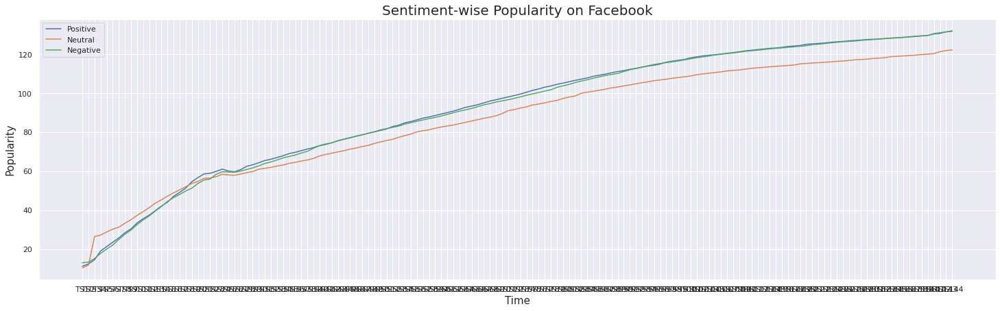

In [ ]:
show_sentiment_popularity_trend(master_df, df, Platform, rows )

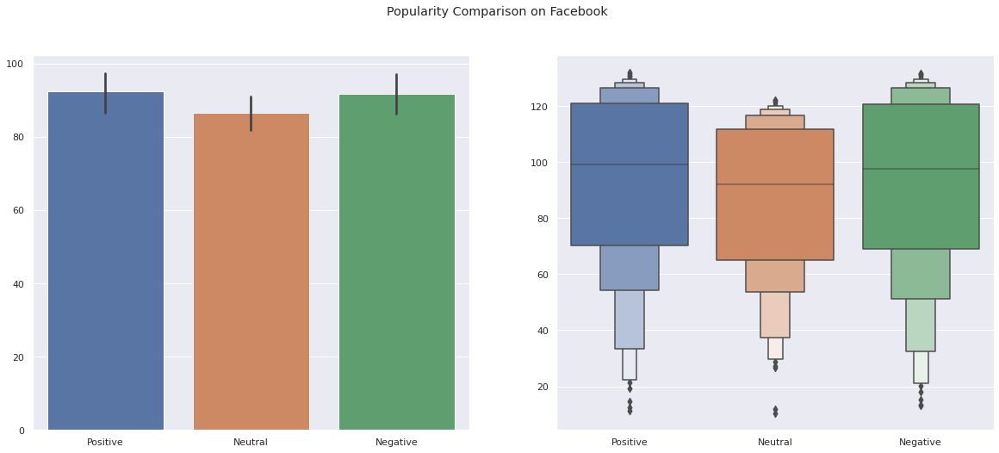

In [ ]:
show_sentiment_popularity_comparison(master_df, df, Platform, rows)

In [ ]:
Sentiment_Type = "SentimentTitle" #@param ["Select Type", "SentimentHeadline", "SentimentTitle"]

In [ ]:
def show_popularities(df, sentiment):
    platform_df = df[['Facebook_scaled', 'GooglePlus_scaled','LinkedIn_scaled']]
    platform_df = abs(platform_df)
    platform_df[f'{sentiment}_Category'] = df[f'{sentiment}_Category']
    temp_df = pd.DataFrame(columns = ['Facebook','GooglePlus','LinkedIn'])
    temp_df['Facebook'] = platform_df.groupby([f'{sentiment}_Category'])['Facebook_scaled'].sum()
    temp_df['GooglePlus'] = platform_df.groupby([f'{sentiment}_Category'])['GooglePlus_scaled'].sum()
    temp_df['LinkedIn'] = platform_df.groupby([f'{sentiment}_Category'])['LinkedIn_scaled'].sum()
    
    
    bars=temp_df.columns

    fig = go.Figure(data=[
        go.Bar(name='Negative', x=bars, y=temp_df['Facebook']),
        go.Bar(name='Neutral', x=bars, y=temp_df['GooglePlus']),
        go.Bar(name='Positive', x=bars, y=temp_df['LinkedIn'])
    ])
    # Change the bar mode
    fig.update_layout(barmode='group',title_text='Sentiment Distribution')
    fig.show()
    # plt.title('Topic-wise Popularity On Each Social Media Platform', fontdict={'size':20})
    # plt.xlabel('Topics', fontdict={'size':15})
    # plt.ylabel('Popularity Level', fontdict={'size':15})
    # plt.show()

show_popularities(master_df, Sentiment_Type)

In [ ]:
def weekday_distribution(df):
    df1 = df[['Facebook','LinkedIn','GooglePlus','Weekday']]
    temp_df = pd.DataFrame([df1.groupby(['Weekday'])['Facebook'].mean(),df1.groupby(['Weekday'])['LinkedIn'].mean(),df1.groupby(['Weekday'])['GooglePlus'].mean()])

    fig, axes = plt.subplots(1, 3, sharex=True, figsize=(25,7))
    fig.suptitle('Weekday Mean News Popularity Distribution', fontdict={'size':20})
    temp_df.T['Facebook'].plot(ax = axes[0],kind='bar', color= 'grey', title='Facebook', ylabel='Popularity')
    temp_df.T['GooglePlus'].plot(ax = axes[1],kind='bar', color= 'lightgreen',title='GooglePlus',ylabel='Popularity')
    temp_df.T['LinkedIn'].plot(ax = axes[2],kind='bar', color= 'red', title='LinkedIn',ylabel='Popularity')
    

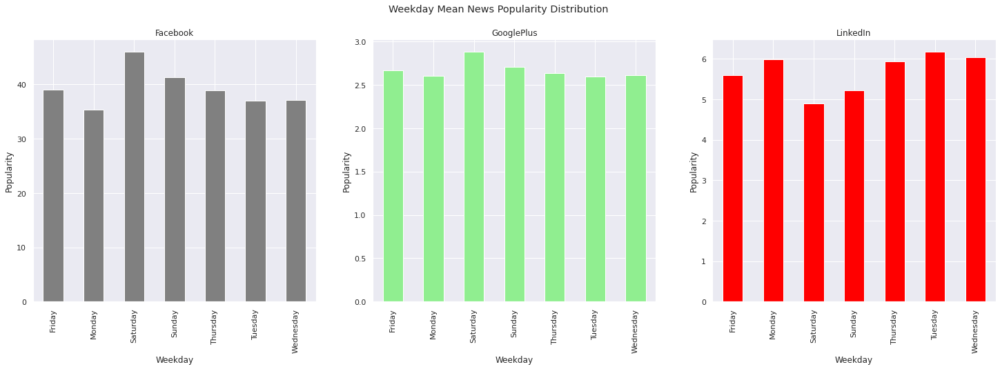

In [ ]:
weekday_distribution(master_df)

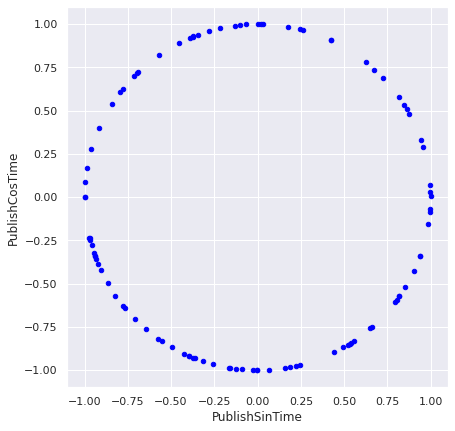

In [ ]:
def work_with_time_and_date(df):
    # Changing time in Seconds
    df['PublishTime'] = df.PublishTime.apply(lambda x: (x.hour * 60 + x.minute) * 60 + x.second)
    seconds_in_day = 24*60*60

    # Making Time Cyclic
    df['PublishSinTime'] = df['PublishTime'].apply(lambda x: np.sin(2*np.pi*x/seconds_in_day))
    df['PublishCosTime'] = df['PublishTime'].apply(lambda x: np.cos(2*np.pi*x/seconds_in_day))

    df.drop(columns='PublishTime',inplace=True)

    # Categorizing Months
    df['PublishMonth'] = master_df['PublishDate'].apply(lambda x: calendar.month_name[x.month])

    return df

master_df = work_with_time_and_date(master_df.copy())
# Cyclic Time
master_df[['PublishSinTime','PublishCosTime']].sample(100).plot.scatter('PublishSinTime','PublishCosTime', c='blue').set_aspect('equal')

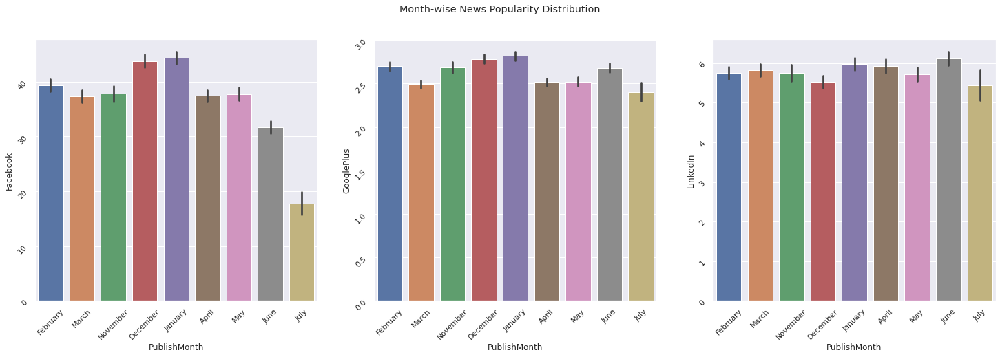

In [ ]:
def show_month_distribution(df):
    fig, axes = plt.subplots(1, 3, figsize=(25,7))
    fig.suptitle('Month-wise News Popularity Distribution', fontdict={'size':20})

    sns.barplot(ax = axes[0],x='PublishMonth',y='Facebook',data = master_df)
    sns.barplot(ax = axes[1],x='PublishMonth',y='GooglePlus',data = master_df)
    sns.barplot(ax = axes[2], x='PublishMonth',y='LinkedIn',data = master_df)
    
    for i in range(3):
        axes[i].tick_params(labelrotation=45)

show_month_distribution(master_df)

In [ ]:
# Merge all the 12 Time Series Dataframe with master_df

def change_df(df, n, col_name_prefix):
    df['TS0'] = 0
    new_df = df[['IDLink']]
    for i,j in zip(range(1,(144//n)+1), range(n, 145, n)):
        new_df[f'{col_name_prefix}_t{i}'] = df[f'TS{j}'] - df[f'TS{j-n}']
    return new_df

def merge_df(fb_df, gp_df, li_df, topic):
    # Convert the dataframe into - "popularity in every 3 hours"
    new_fb_df = change_df(fb_df, 3*6, 'fb')
    new_gp_df = change_df(gp_df, 3*6, 'gp')
    new_li_df = change_df(li_df, 3*6, 'li')

    new_final_df = new_fb_df.merge(new_gp_df.merge(new_li_df, on = 'IDLink', how='outer'), on = 'IDLink', how='outer')

    return new_final_df


def merge_all_df(master_df, df):
    
    # Step 1: Split master_df into Topics: Economy, Microsoft, Obama, Palestine
    economy_df, microsoft_df, obama_df, palestine_df = master_df[master_df.Topic == 'economy'], master_df[master_df.Topic == 'microsoft'], master_df[master_df.Topic == 'obama'], master_df[master_df.Topic == 'palestine']

    # Step 2: Combine all Topics dataframes: like: (Facebook_Economy, LinkedIn_Economy, GooglePlus_Economy), (Facebook_Obama, GooglePlus_Obama, LinkedIn_Obama), etc.
    
    df_time_dict = {}
    for topic in ['Economy','Microsoft','Obama','Palestine']:
        df_time_dict[topic] = merge_df(df[f'Facebook_{topic}'], df[f'GooglePlus_{topic}'], df[f'LinkedIn_{topic}'], topic )

    # Step 3: Merge splitted master_df dataframe and df_time_dict dataframes
    economy_df = economy_df.merge(df_time_dict['Economy'], on='IDLink',how = 'left')
    microsoft_df = microsoft_df.merge(df_time_dict['Microsoft'], on='IDLink',how = 'left')
    obama_df = obama_df.merge(df_time_dict['Obama'], on='IDLink',how = 'left')
    palestine_df = palestine_df.merge(df_time_dict['Palestine'], on='IDLink',how = 'left')


    # print(economy_df.shape, microsoft_df.shape, obama_df.shape, palestine_df.shape)
    
    # Step 4: Append all the dataframes to make the final master dataframe
    final_master_df = economy_df.append(microsoft_df.append(obama_df.append(palestine_df)))

    # Removing Null values
    print('Before: ',list(final_master_df.isna().sum()))

    # Checking for any news who has any popularity on any social media and it's time series columns are null
    temp = final_master_df[final_master_df.isnull().any(axis=1)]
    null_indexes = temp[temp['Facebook'] != 1].index
    for ind in null_indexes:
        final_master_df.fb_t1 = 1  # Popularity of those news after 2 days is 1. So, at some point in time, the popularity difference would be one.

    final_master_df.fillna(0, inplace=True)
    print('After: ',list(final_master_df.isna().sum()))

    return final_master_df

master_df = merge_all_df(master_df.copy(), df.copy())

Before:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 5317, 5317, 5317, 5317, 5317, 5317, 5317, 5317, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
After:  [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [ ]:
master_df.head(2)

,IDLink,Title,Headline,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,SentimentTitle_Category,SentimentHeadline_Category,Source_type,Hour,PublishSinTime,PublishCosTime,PublishMonth,fb_t1,fb_t2,fb_t3,fb_t4,fb_t5,fb_t6,fb_t7,fb_t8,gp_t1,gp_t2,gp_t3,gp_t4,gp_t5,gp_t6,gp_t7,gp_t8,li_t1,li_t2,li_t3,li_t4,li_t5,li_t6,li_t7,li_t8
0,252.0,Economy to improve though no change in last 6 ...,"&quot;In the coming six months, there seems to...",economy,2015-11-08,-0.082022,0.205537,1.0,1.0,1.0,Sunday,-0.604085,-0.617774,-0.549165,negative,positive,A,05,0.996195,0.087156,November,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
1,227.0,Economy to improve though no change in last 6 ...,"New Delhi, Nov 8 (IANS) Majority of Indian bus...",economy,2015-11-08,-0.082022,0.186968,1.0,1.0,1.0,Sunday,-0.604085,-0.617774,-0.549165,negative,positive,B,05,0.998630,0.052336,November,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1


In [ ]:
def cols_to_remove(df):
    cols = []
    for col in df.columns:
        try:
            int(col)
            cols.append(col)
        except:
            continue

    return cols


def title_headline_processing():
    st = PorterStemmer()
    master_df['title_headline'] = master_df['Title']+', '+master_df['Headline']
    master_df['title_headline'] = master_df['title_headline'].apply(lambda x: " ".join([st.stem(word) for word in x.split()]))
    master_df['title_headline'] = master_df['title_headline'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))

    tfidfvectorizer = TfidfVectorizer(analyzer='word',stop_words='english',max_df=0.7, min_df = 100, max_features = 1000)
    tfidf_wm = tfidfvectorizer.fit_transform(master_df['title_headline'])
    tfidf_tokens = tfidfvectorizer.get_feature_names()
    df_tfidfvect = pd.DataFrame(data = tfidf_wm.toarray(), columns=tfidf_tokens)
    df_tfidfvect['IDLink'] = master_df['IDLink'].reset_index(drop=True).copy()

    trash_cols = cols_to_remove(df_tfidfvect)

    # Removing all the numeric columns
    df_tfidfvect.drop(columns=trash_cols, inplace=True)

    return df_tfidfvect

tfidfvect_df = title_headline_processing()

In [ ]:
tfidfvect_df.head()

,abe,abl,access,accord,account,accus,acquir,act,action,activ,actual,ad,add,addit,address,administr,administration,advanc,advis,affect,africa,african,agenc,agenda,ago,agre,agreement,ahead,aid,aim,air,al,alberta,allow,alreadi,amazon,america,american,amid,amp,...,vow,wa,wage,wall,want,war,warn,washington,watch,water,way,weak,web,wednesday,week,weekend,weigh,welcom,west,whi,white,win,window,woman,won,word,work,worker,world,worri,worst,xbox,year,years,yellen,yesterday,york,young,zika,IDLink
0,0.0,0.0,0.0,0.000000,0.198001,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.176918,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,252.0
1,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,227.0
2,0.0,0.0,0.0,0.157242,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.13981,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0
3,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.276477,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0
4,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,294.0


In [ ]:
# def text_process(msg):
#     nopunc = [c for c in msg if c not in string.punctuation]
#     nopunc = ''.join(nopunc)
#     return ' '.join([word for word in nopunc.split() if word.lower() not in stopwords.words('english')])

# def add_doc_length():
#     word_len_df = master_df[['Title','Headline','Facebook','GooglePlus','LinkedIn']]
#     word_len_df

#     word_len_df['Title'] = word_len_df['Title'].apply(text_process)
#     word_len_df['Headline'] = word_len_df['Headline'].apply(text_process)

#     master_df['Title_wl'] = word_len_df.Title.apply(lambda x: len(x.split()))
#     master_df['Headline_wl'] = word_len_df.Headline.apply(lambda x: len(x.split()))

def add_doc_length():
    countVecorizer = CountVectorizer(analyzer = 'word', stop_words = 'english', max_df=0.7, min_df = 150)
    count_wm_title = countVecorizer.fit_transform(master_df['Title'])
    
    count_tokens_title = countVecorizer.get_feature_names()
    df1 = pd.DataFrame(data = count_wm_title.toarray(),columns = count_tokens_title)

    count_wm_headline = countVecorizer.fit_transform(master_df['Headline'])
    count_tokens_headline = countVecorizer.get_feature_names()
    df2 = pd.DataFrame(data = count_wm_headline.toarray(),columns = count_tokens_headline)
    master_df['Title_wl'] = df1.sum(axis = 1)
    master_df['Headline_wl'] = df2.sum(axis = 1)

add_doc_length()

In [ ]:
def show_doc_length_desity_plot(df):
    fig, axes = plt.subplots(1, 2, figsize=(25,7))
    
    sns.distplot(df['Title_wl'], ax= axes[0], color='brown')
    axes[0].set_title('Title',fontdict={'fontsize': '15', 'fontweight' : 'bold'})

    sns.distplot(df['Headline_wl'],ax= axes[1], color='black')
    axes[1].set_title('Headline',fontdict={'fontsize': '15', 'fontweight' : 'bold'})

    fig.suptitle('Title And Headline Document Length Distribution', fontdict={'fontsize': '20', 'fontweight' : 'bold'})


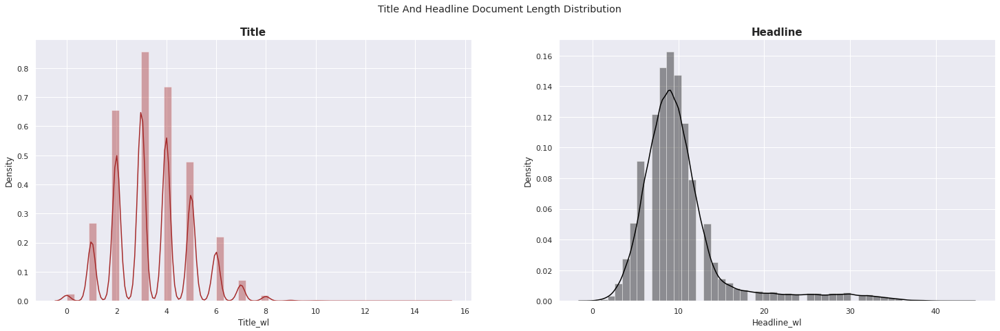

In [ ]:
show_doc_length_desity_plot(master_df) 

In [ ]:
def show_doc_length_relation_with_popularity(df):
    fig, axes = plt.subplots(3, 2, figsize=(25,25))
    
    sns.scatterplot(ax= axes[0][0],data = df, x = 'Title_wl', y='Facebook_scaled', color='green')
    axes[0][0].set_title('Title on Facebook',fontdict={'fontsize': '15', 'fontweight' : 'bold'})

    sns.scatterplot(ax= axes[0][1],data = df, x = 'Headline_wl', y='Facebook_scaled', color='green')
    axes[0][1].set_title('Headline on Facebook',fontdict={'fontsize': '15', 'fontweight' : 'bold'})


    sns.scatterplot(ax= axes[1][0],data = df, x = 'Title_wl', y='GooglePlus_scaled', color='red')
    axes[1][0].set_title('Title on GooglePlus',fontdict={'fontsize': '15', 'fontweight' : 'bold'})


    sns.scatterplot(ax= axes[1][1],data = df, x = 'Headline_wl', y='GooglePlus_scaled', color='red')
    axes[1][1].set_title('Headline on GooglePlus',fontdict={'fontsize': '15', 'fontweight' : 'bold'})

    
    sns.scatterplot(ax= axes[2][0],data = df, x = 'Title_wl', y='LinkedIn_scaled', color='blue')
    axes[2][0].set_title('Title on LinkedIn',fontdict={'fontsize': '15', 'fontweight' : 'bold'})

    sns.scatterplot(ax= axes[2][1],data = df, x = 'Headline_wl', y='LinkedIn_scaled', color='blue')
    axes[2][1].set_title('Headline on LinkedIn',fontdict={'fontsize': '15', 'fontweight' : 'bold'})

    fig.suptitle('Effect Of Title And Headline Length On Popularity', fontdict={'fontsize': '20', 'fontweight' : 'bold'})


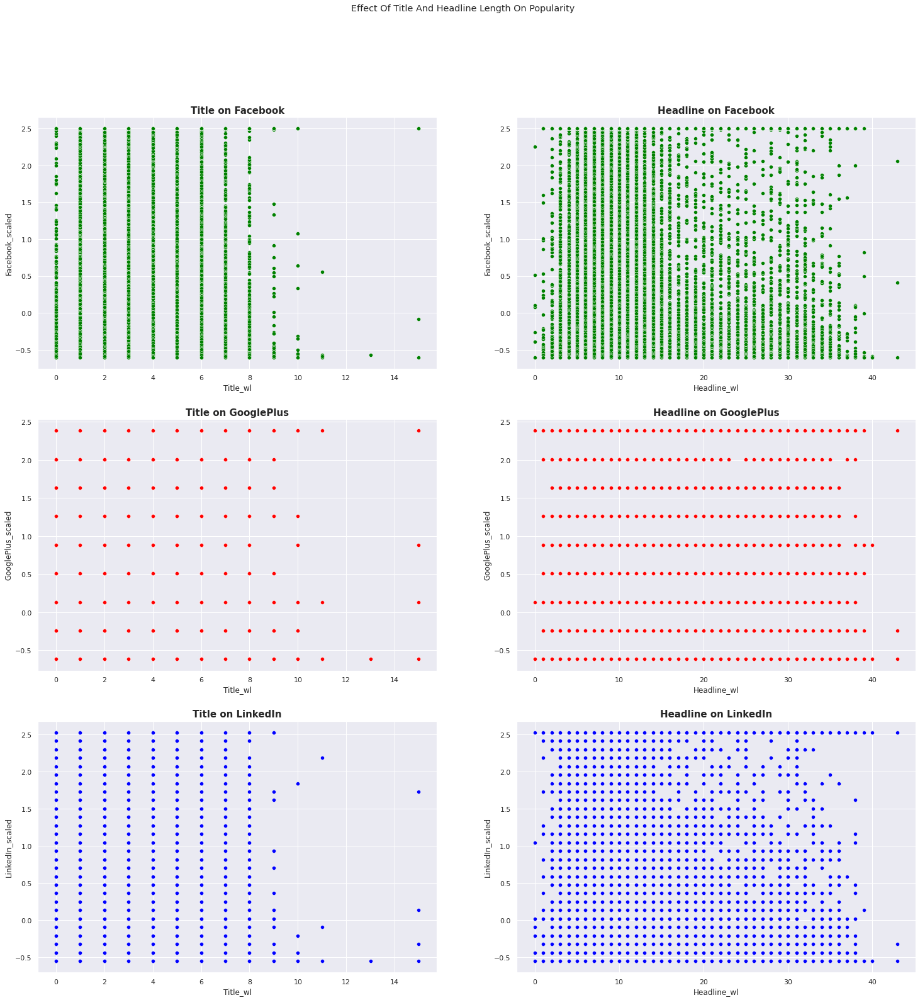

In [ ]:
show_doc_length_relation_with_popularity(master_df)

In [ ]:
master_df.head(2)

,IDLink,Title,Headline,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,SentimentTitle_Category,SentimentHeadline_Category,Source_type,Hour,PublishSinTime,PublishCosTime,PublishMonth,fb_t1,fb_t2,fb_t3,fb_t4,fb_t5,fb_t6,fb_t7,fb_t8,gp_t1,gp_t2,gp_t3,gp_t4,gp_t5,gp_t6,gp_t7,gp_t8,li_t1,li_t2,li_t3,li_t4,li_t5,li_t6,li_t7,li_t8,title_headline,Title_wl,Headline_wl
0,252.0,Economy to improve though no change in last 6 ...,"&quot;In the coming six months, there seems to...",economy,2015-11-08,-0.082022,0.205537,1.0,1.0,1.0,Sunday,-0.604085,-0.617774,-0.549165,negative,positive,A,05,0.996195,0.087156,November,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,economi to improv though no chang in last 6 mo...,2,29
1,227.0,Economy to improve though no change in last 6 ...,"New Delhi, Nov 8 (IANS) Majority of Indian bus...",economy,2015-11-08,-0.082022,0.186968,1.0,1.0,1.0,Sunday,-0.604085,-0.617774,-0.549165,negative,positive,B,05,0.998630,0.052336,November,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,economi to improv though no chang in last 6 mo...,2,18


In [ ]:
# Merging TfidfVectorized dataframe and master_df

master_df = master_df.merge(tfidfvect_df, on='IDLink', how = 'left')
master_df.head(2)

,IDLink,Title,Headline,Topic,PublishDate,SentimentTitle,SentimentHeadline,Facebook,GooglePlus,LinkedIn,Weekday,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,SentimentTitle_Category,SentimentHeadline_Category,Source_type,Hour,PublishSinTime,PublishCosTime,PublishMonth,fb_t1,fb_t2,fb_t3,fb_t4,fb_t5,fb_t6,fb_t7,fb_t8,gp_t1,gp_t2,gp_t3,gp_t4,gp_t5,gp_t6,gp_t7,gp_t8,li_t1,li_t2,li_t3,...,voter,vow,wa,wage,wall,want,war,warn,washington,watch,water,way,weak,web,wednesday,week,weekend,weigh,welcom,west,whi,white,win,window,woman,won,word,work,worker,world,worri,worst,xbox,year,years,yellen,yesterday,york,young,zika
0,252.0,Economy to improve though no change in last 6 ...,"&quot;In the coming six months, there seems to...",economy,2015-11-08,-0.082022,0.205537,1.0,1.0,1.0,Sunday,-0.604085,-0.617774,-0.549165,negative,positive,A,05,0.996195,0.087156,November,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,1,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.176918,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,227.0,Economy to improve though no change in last 6 ...,"New Delhi, Nov 8 (IANS) Majority of Indian bus...",economy,2015-11-08,-0.082022,0.186968,1.0,1.0,1.0,Sunday,-0.604085,-0.617774,-0.549165,negative,positive,B,05,0.998630,0.052336,November,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,1,0,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# Dropping irrelevant columns, i.e. other than 
# irrelevant_columns = ['IDLink', 'Title', 'Headline', 'PublishDate', 'Facebook', 
#                       'GooglePlus', 'LinkedIn', 'SentimentTitle_Category',
#                       'SentimentHeadline_Category','Hour','title_headline']

irrelevant_columns = ['IDLink', 'Title', 'Headline', 'PublishDate', 'Facebook',
                      'SentimentTitle','SentimentHeadline', 'GooglePlus', 
                      'LinkedIn', 'Hour','title_headline']
master_df.drop(columns = irrelevant_columns, inplace = True)

In [ ]:
master_df = pd.get_dummies(master_df, columns=['Topic','SentimentTitle_Category','SentimentHeadline_Category','Source_type','PublishMonth','Weekday'])
master_df.head()

,Facebook_scaled,GooglePlus_scaled,LinkedIn_scaled,PublishSinTime,PublishCosTime,fb_t1,fb_t2,fb_t3,fb_t4,fb_t5,fb_t6,fb_t7,fb_t8,gp_t1,gp_t2,gp_t3,gp_t4,gp_t5,gp_t6,gp_t7,gp_t8,li_t1,li_t2,li_t3,li_t4,li_t5,li_t6,li_t7,li_t8,Title_wl,Headline_wl,abe,abl,access,accord,account,accus,acquir,act,action,...,worri,worst,xbox,year,years,yellen,yesterday,york,young,zika,Topic_economy,Topic_microsoft,Topic_obama,Topic_palestine,SentimentTitle_Category_negative,SentimentTitle_Category_neutral,SentimentTitle_Category_positive,SentimentHeadline_Category_negative,SentimentHeadline_Category_neutral,SentimentHeadline_Category_positive,Source_type_A,Source_type_B,Source_type_C,Source_type_D,PublishMonth_April,PublishMonth_December,PublishMonth_February,PublishMonth_January,PublishMonth_July,PublishMonth_June,PublishMonth_March,PublishMonth_May,PublishMonth_November,Weekday_Friday,Weekday_Monday,Weekday_Saturday,Weekday_Sunday,Weekday_Thursday,Weekday_Tuesday,Weekday_Wednesday
0,-0.604085,-0.617774,-0.549165,0.996195,0.087156,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,2,29,0.0,0.0,0.0,0.000000,0.198001,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
1,-0.604085,-0.617774,-0.549165,0.998630,0.052336,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,2,18,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
2,-0.587922,-0.617774,-0.549165,0.782608,-0.622515,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,25,0.0,0.0,0.0,0.157242,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
3,-0.135357,-0.617774,-0.549165,0.659346,-0.751840,0.0,0.0,0.0,0.0,0.0,0.0,29.0,1.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,3,13,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
4,-0.571759,-0.617774,-0.207110,-0.233445,-0.972370,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,4,0,0,1,14,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0


In [ ]:
master_df.shape

(87478, 1035)

# Feature Selection

In [ ]:
# Fetching Numerical Features and Dependent Features

x1 = master_df[['PublishSinTime','PublishCosTime','Title_wl','Headline_wl']]
x2 = master_df.loc[:,'fb_t1':'li_t8']

for col in x2:
    x1[col] = x2[col]

y1 = master_df['Facebook_scaled']
y2 = master_df['GooglePlus_scaled']
y3 = master_df['LinkedIn_scaled']

# Train-Test Split for each dependent feature
x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size = 0.3, random_state=23)
x2_train, x2_test, y2_train, y2_test = train_test_split(x1, y2, test_size = 0.3, random_state=23)
x3_train, x3_test, y3_train, y3_test = train_test_split(x1, y3, test_size = 0.3, random_state=23)

In [ ]:
x1_train.shape

(61234, 28)

## Variance

In [ ]:
vars_thres = VarianceThreshold(threshold=0)
vars_thres.fit(x1_train)
print('Constant Columns:',sum(vars_thres.get_support()))
constant_cols1 = [col for col in x1_train.columns if col not in x1_train.columns[vars_thres.get_support()]]
print('Zero Variance Columns:',(len(constant_cols1)))

Constant Columns: 28
Zero Variance Columns: 0


## Correlation

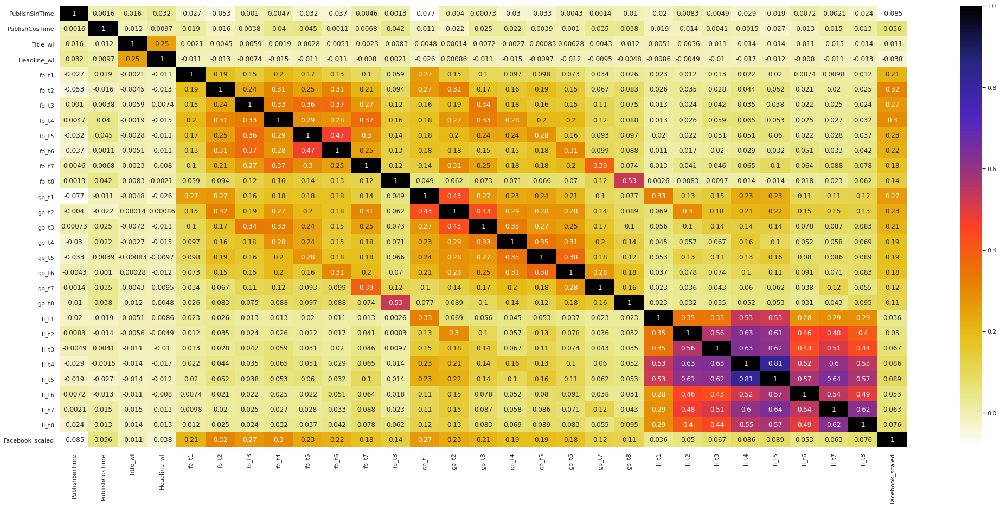

In [ ]:
x1_train['Facebook_scaled'] = y1_train
x2_train['GooglePlus_scaled'] = y2_train
x3_train['LinkedIn_scaled'] = y3_train

plt.figure(figsize = (35,15))
sns.heatmap(x1_train.corr(),annot = True,cmap=plt.cm.CMRmap_r)

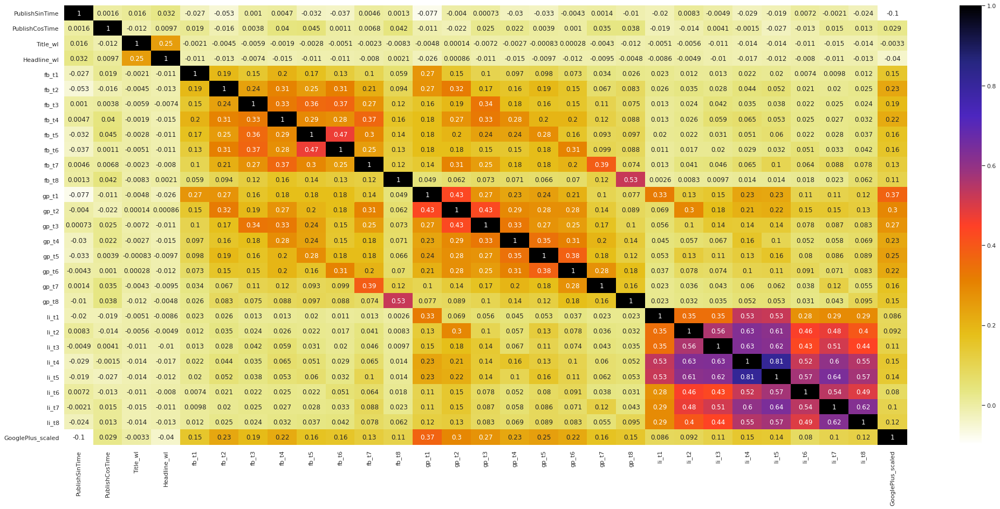

In [ ]:
plt.figure(figsize = (35,15))
sns.heatmap(x2_train.corr(),annot = True,cmap=plt.cm.CMRmap_r)

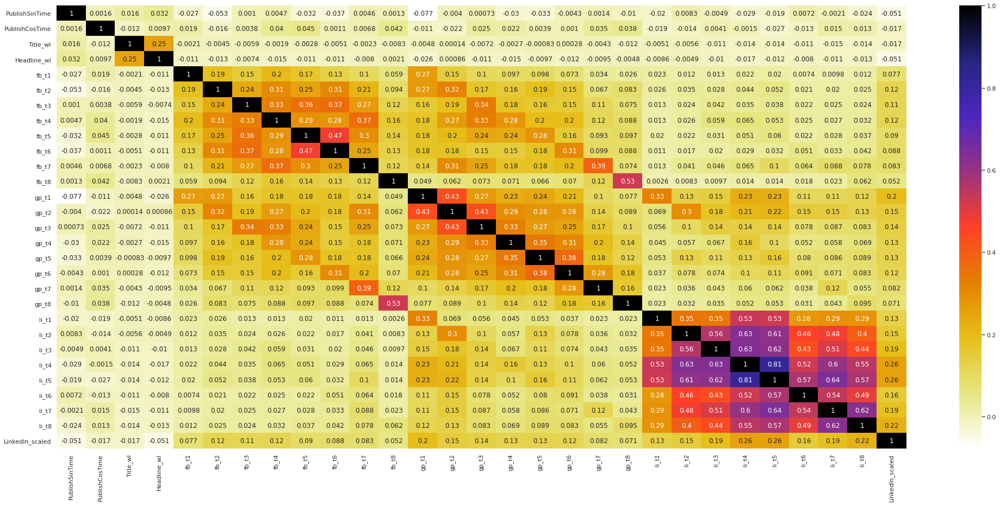

In [ ]:
plt.figure(figsize = (35,15))
sns.heatmap(x3_train.corr(),annot = True,cmap=plt.cm.CMRmap_r)

In [ ]:
# def correlation(dataset, threshold):
#     col_corr = set()
#     corr_matrix = dataset.corr()
#     for i in range(len(corr_matrix.columns)):
#         for j in range(i):
#             if corr_matrix.iloc[i,j] >= threshold:
#                 col_name = corr_matrix.columns[i]
#                 col_corr.add(col_name)
#     return col_corr

In [ ]:
# corr_features = correlation(x1_train, 0.7)
# len(set(corr_features))

4

In [ ]:
# from statsmodels.stats.outliers_influence import variance_inflation_factor
# x = x1_train.drop('Facebook_scaled',1)
# y = x1_train.Facebook_scaled

In [ ]:
# x2 = master_df.loc[:,'fb_t1':'li_t16']

# for col in x2:
#     x[col] = x2[col]

In [ ]:
# def cal_vif(x):
#     thresh = 2
#     output = pd.DataFrame()
#     k = x.shape[1]
#     vif = [variance_inflation_factor(x.values, i) for i in range(x.shape[1])]
#     for i in range(1,k):
#         print('Iteration No.:',i)
#         print(vif)
#         a = np.argmax(vif)
#         print('Max vif is for variable No.:',a)
#         if vif[a]<thresh:
#             break
#         if i==1:
#             output = x.drop(x.columns[a],axis=1)
#             vif = [variance_inflation_factor(output.values,j) for j in range(output.shape[1])]
#         elif i>1:
#             output = output.drop(output.columns[a],axis=1)
#             vif = [variance_inflation_factor(output.values, j) for j in range(output.shape[1])]
#     return output

# selected_features = cal_vif(x)
# selected_features

Iteration No.: 1
[1.0372949044421438, 1.0742541240678471, 1.0497504254497363, 1.0206128619030883, 3.93604573703386, 3.8813856500761186, 1.0389060338586715, 1.4543776665521793, 1.189371134617591, 1.367363049245518, 1.208744947275984, 1.3240530987126256, 1.3353212191325285, 1.4549539533007725, 1.3663878710657766, 1.4025238965089055, 1.455720803833144, 1.4131933504128278, 1.3559441076495025, 1.4609395923430781, 1.2836071448772235, 1.5367154338981457, 1.643366623514998, 1.85306673578476, 1.875297678415071, 1.8088367346905312, 1.3789448101267459, 1.5901705222426683, 1.275798115680904, 1.6553042179967594, 1.5541759719511417, 1.1742836707699218, 1.3742712599329496, 1.4400995028590602, 1.2669237510641302, 1.3124828296416415, 1.1834056196141758, 1.52687400886576, 1.9774393724568755, 1.6272512005949258, 4.5748013573172095, 4.878769339853103, 2.2648116729274084, 1.2669747425922804, 2.6505171481366565, 3.2457044200305694, 3.295804295991725, 3.9024175836224857, 1.271561420230765, 2.2481337106583563

""
